# Norman

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import rapids_singlecell as rsc
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: True


In [3]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [4]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    adata_file_path = os.path.join(tardis.config.io_directories["processed"], "cpa_Norman2019_prep_new.h5ad")
    assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
    adata = ad.read_h5ad(adata_file_path)
    adata.X = adata.layers["counts"].copy()
    del adata.layers
    gc.collect()
adata

AnnData object with n_obs × n_vars = 108497 × 5000
    obs: 'cov_drug_dose_name', 'dose_val', 'control', 'condition', 'guide_identity', 'drug_dose_name', 'cell_type', 'split', 'split1', 'split2', 'split3', 'split4', 'split5', 'split6', 'split7', 'split8', 'split9', 'split10', 'split11', 'split12', 'split13', 'split14', 'split15', 'split16', 'split17', 'split18', 'split19', 'split20', 'split21', 'split22', 'split23', 'split24', 'split25'
    var: 'gene_symbols', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'rank_genes_groups_cov'

## Train

In [5]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "condition",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            )
        ]
    )
]

In [6]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(12 + 12 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
    encode_covariates=False
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=0.5, 
    limit_val_batches=0.5,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=None,
    model_level_metrics_helper_covariates=None
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

CUDA backend failed to initialize: Found cuDNN version 8700, but JAX was built against version 8907, which is newer. The copy of cuDNN that is installed must be at least as new as the version against which JAX was built. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: lq6bti4l
Name: effortless-salad-608
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/lq6bti4l
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240507_005047-lq6bti4l/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
You are using a CUDA device ('NVIDIA A100 80GB PCIe') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `training` set. Number of elements in each group: 221,383,447,178,398,314,544,143,485,360,418,369,244,282,45,201,449,280,283,558,244,278,157,50,331,146,110,294,96,84,182,191,52,331,230,159,265,141,85,182,373,468,334,997,145,373,168,186,283,314,231,136,371,270,266,383,322,622,304,279,238,576,237,155,270,324,280,726,350,361,255,366,374,373,127,223,221,156,59,126,204,500,321,273,327,213,154,240,375,167,138,95,268,402,147,168,452,77,147,301,175,360,98,243,186,200,341,128,150,297,271,106,112,357,345,358,274,42,51,206,214,272,80,202,335,257,182,247,283,213,940,265,198,519,308,151,498,340,496,476,215,464,468,267,345,245,351,240,281,291,265,248,260,386,409,249,239,193,157,630,259,238,131,150,179,163,535,253,373,217,274,421,577,394,282,254,221,221,175,177,210,193,207,244,617,350,327,350,371,7148,394,264,206,174,363,178,251,265,166,320,

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `validation` set. Number of elements in each group: 55,98,111,54,97,65,143,32,97,103,115,95,57,76,14,63,113,85,65,105,62,57,31,14,79,38,24,70,30,23,48,54,12,81,56,52,66,39,29,55,95,98,81,222,34,102,47,55,72,84,54,42,99,58,63,95,65,165,78,87,52,155,60,28,52,101,74,179,91,84,69,93,77,72,32,61,56,35,12,25,43,130,61,72,99,59,38,55,104,49,37,35,61,92,45,32,100,19,46,67,40,103,28,60,51,74,69,39,33,71,78,34,29,88,82,86,53,12,8,60,64,57,16,52,60,54,55,51,78,50,257,72,43,128,67,41,125,92,130,105,46,107,111,71,106,55,93,62,82,75,74,54,59,114,88,64,59,44,35,140,51,55,45,36,36,39,132,62,107,52,71,91,173,119,90,68,63,70,43,45,54,43,48,61,146,84,85,96,92,1759,136,85,39,37,83,39,80,67,34,83,35,82,73,85,70,148,58,61,99,24,17,53,52,77,21,52,71,80,33,40,68,72,61,60,53,45,64,77,51,63,68,102,60,75,13,52,36,148,116,119,93,71,63,63,196,89,26,42,62,

Epoch 1/600:   0%|          | 1/600 [00:11<1:58:08, 11.83s/it]

Epoch 1/600:   0%|          | 1/600 [00:11<1:58:08, 11.83s/it, v_num=4l_1, total_loss_train=1.9e+3, kl_local_train=65.1]

Epoch 2/600:   0%|          | 1/600 [00:11<1:58:08, 11.83s/it, v_num=4l_1, total_loss_train=1.9e+3, kl_local_train=65.1]

Epoch 2/600:   0%|          | 2/600 [00:17<1:23:12,  8.35s/it, v_num=4l_1, total_loss_train=1.9e+3, kl_local_train=65.1]

Epoch 2/600:   0%|          | 2/600 [00:17<1:23:12,  8.35s/it, v_num=4l_1, total_loss_train=1.34e+3, kl_local_train=81.8]

Epoch 3/600:   0%|          | 2/600 [00:17<1:23:12,  8.35s/it, v_num=4l_1, total_loss_train=1.34e+3, kl_local_train=81.8]

Epoch 3/600:   0%|          | 3/600 [00:23<1:11:39,  7.20s/it, v_num=4l_1, total_loss_train=1.34e+3, kl_local_train=81.8]

Epoch 3/600:   0%|          | 3/600 [00:23<1:11:39,  7.20s/it, v_num=4l_1, total_loss_train=1.32e+3, kl_local_train=76.1]

Epoch 4/600:   0%|          | 3/600 [00:23<1:11:39,  7.20s/it, v_num=4l_1, total_loss_train=1.32e+3, kl_local_train=76.1]

Epoch 4/600:   1%|          | 4/600 [00:29<1:06:06,  6.66s/it, v_num=4l_1, total_loss_train=1.32e+3, kl_local_train=76.1]

Epoch 4/600:   1%|          | 4/600 [00:29<1:06:06,  6.66s/it, v_num=4l_1, total_loss_train=1.32e+3, kl_local_train=60.6]

Epoch 5/600:   1%|          | 4/600 [00:29<1:06:06,  6.66s/it, v_num=4l_1, total_loss_train=1.32e+3, kl_local_train=60.6]

Epoch 5/600:   1%|          | 5/600 [00:35<1:03:05,  6.36s/it, v_num=4l_1, total_loss_train=1.32e+3, kl_local_train=60.6]

Epoch 5/600:   1%|          | 5/600 [00:35<1:03:05,  6.36s/it, v_num=4l_1, total_loss_train=1.31e+3, kl_local_train=38.4]

Epoch 6/600:   1%|          | 5/600 [00:35<1:03:05,  6.36s/it, v_num=4l_1, total_loss_train=1.31e+3, kl_local_train=38.4]

Epoch 6/600:   1%|          | 6/600 [00:41<1:01:21,  6.20s/it, v_num=4l_1, total_loss_train=1.31e+3, kl_local_train=38.4]

Epoch 6/600:   1%|          | 6/600 [00:41<1:01:21,  6.20s/it, v_num=4l_1, total_loss_train=1.3e+3, kl_local_train=28.6] 

Epoch 7/600:   1%|          | 6/600 [00:41<1:01:21,  6.20s/it, v_num=4l_1, total_loss_train=1.3e+3, kl_local_train=28.6]

Epoch 7/600:   1%|          | 7/600 [00:46<1:00:05,  6.08s/it, v_num=4l_1, total_loss_train=1.3e+3, kl_local_train=28.6]

Epoch 7/600:   1%|          | 7/600 [00:46<1:00:05,  6.08s/it, v_num=4l_1, total_loss_train=1.29e+3, kl_local_train=37.4]

Epoch 8/600:   1%|          | 7/600 [00:46<1:00:05,  6.08s/it, v_num=4l_1, total_loss_train=1.29e+3, kl_local_train=37.4]

Epoch 8/600:   1%|▏         | 8/600 [00:52<59:14,  6.00s/it, v_num=4l_1, total_loss_train=1.29e+3, kl_local_train=37.4]  

Epoch 8/600:   1%|▏         | 8/600 [00:52<59:14,  6.00s/it, v_num=4l_1, total_loss_train=1.28e+3, kl_local_train=42.4]

Epoch 9/600:   1%|▏         | 8/600 [00:52<59:14,  6.00s/it, v_num=4l_1, total_loss_train=1.28e+3, kl_local_train=42.4]

Epoch 9/600:   2%|▏         | 9/600 [00:58<58:39,  5.96s/it, v_num=4l_1, total_loss_train=1.28e+3, kl_local_train=42.4]

Epoch 9/600:   2%|▏         | 9/600 [00:58<58:39,  5.96s/it, v_num=4l_1, total_loss_train=1.27e+3, kl_local_train=50.7]

Epoch 10/600:   2%|▏         | 9/600 [00:58<58:39,  5.96s/it, v_num=4l_1, total_loss_train=1.27e+3, kl_local_train=50.7]

Epoch 10/600:   2%|▏         | 10/600 [01:04<58:17,  5.93s/it, v_num=4l_1, total_loss_train=1.27e+3, kl_local_train=50.7]

Epoch 10/600:   2%|▏         | 10/600 [01:04<58:17,  5.93s/it, v_num=4l_1, total_loss_train=1.27e+3, kl_local_train=55]  

Epoch 11/600:   2%|▏         | 10/600 [01:04<58:17,  5.93s/it, v_num=4l_1, total_loss_train=1.27e+3, kl_local_train=55]

Epoch 11/600:   2%|▏         | 11/600 [01:10<57:57,  5.90s/it, v_num=4l_1, total_loss_train=1.27e+3, kl_local_train=55]

Epoch 11/600:   2%|▏         | 11/600 [01:10<57:57,  5.90s/it, v_num=4l_1, total_loss_train=1.26e+3, kl_local_train=60.7]

Epoch 12/600:   2%|▏         | 11/600 [01:10<57:57,  5.90s/it, v_num=4l_1, total_loss_train=1.26e+3, kl_local_train=60.7]

Epoch 12/600:   2%|▏         | 12/600 [01:16<57:42,  5.89s/it, v_num=4l_1, total_loss_train=1.26e+3, kl_local_train=60.7]

Epoch 12/600:   2%|▏         | 12/600 [01:16<57:42,  5.89s/it, v_num=4l_1, total_loss_train=1.26e+3, kl_local_train=64.1]

Epoch 13/600:   2%|▏         | 12/600 [01:16<57:42,  5.89s/it, v_num=4l_1, total_loss_train=1.26e+3, kl_local_train=64.1]

Epoch 13/600:   2%|▏         | 13/600 [01:22<57:30,  5.88s/it, v_num=4l_1, total_loss_train=1.26e+3, kl_local_train=64.1]

Epoch 13/600:   2%|▏         | 13/600 [01:22<57:30,  5.88s/it, v_num=4l_1, total_loss_train=1.26e+3, kl_local_train=64.2]

Epoch 14/600:   2%|▏         | 13/600 [01:22<57:30,  5.88s/it, v_num=4l_1, total_loss_train=1.26e+3, kl_local_train=64.2]

Epoch 14/600:   2%|▏         | 14/600 [01:27<57:25,  5.88s/it, v_num=4l_1, total_loss_train=1.26e+3, kl_local_train=64.2]

Epoch 14/600:   2%|▏         | 14/600 [01:27<57:25,  5.88s/it, v_num=4l_1, total_loss_train=1.25e+3, kl_local_train=67.7]

Epoch 15/600:   2%|▏         | 14/600 [01:27<57:25,  5.88s/it, v_num=4l_1, total_loss_train=1.25e+3, kl_local_train=67.7]

Epoch 15/600:   2%|▎         | 15/600 [01:33<57:23,  5.89s/it, v_num=4l_1, total_loss_train=1.25e+3, kl_local_train=67.7]

Epoch 15/600:   2%|▎         | 15/600 [01:33<57:23,  5.89s/it, v_num=4l_1, total_loss_train=1.25e+3, kl_local_train=69.3]

Epoch 16/600:   2%|▎         | 15/600 [01:33<57:23,  5.89s/it, v_num=4l_1, total_loss_train=1.25e+3, kl_local_train=69.3]

Epoch 16/600:   3%|▎         | 16/600 [01:39<57:10,  5.87s/it, v_num=4l_1, total_loss_train=1.25e+3, kl_local_train=69.3]

Epoch 16/600:   3%|▎         | 16/600 [01:39<57:10,  5.87s/it, v_num=4l_1, total_loss_train=1.25e+3, kl_local_train=71.7]

Epoch 17/600:   3%|▎         | 16/600 [01:39<57:10,  5.87s/it, v_num=4l_1, total_loss_train=1.25e+3, kl_local_train=71.7]

Epoch 17/600:   3%|▎         | 17/600 [01:45<57:15,  5.89s/it, v_num=4l_1, total_loss_train=1.25e+3, kl_local_train=71.7]

Epoch 17/600:   3%|▎         | 17/600 [01:45<57:15,  5.89s/it, v_num=4l_1, total_loss_train=1.25e+3, kl_local_train=74.9]

Epoch 18/600:   3%|▎         | 17/600 [01:45<57:15,  5.89s/it, v_num=4l_1, total_loss_train=1.25e+3, kl_local_train=74.9]

Epoch 18/600:   3%|▎         | 18/600 [01:51<57:04,  5.88s/it, v_num=4l_1, total_loss_train=1.25e+3, kl_local_train=74.9]

Epoch 18/600:   3%|▎         | 18/600 [01:51<57:04,  5.88s/it, v_num=4l_1, total_loss_train=1.25e+3, kl_local_train=77.6]

Epoch 19/600:   3%|▎         | 18/600 [01:51<57:04,  5.88s/it, v_num=4l_1, total_loss_train=1.25e+3, kl_local_train=77.6]

Epoch 19/600:   3%|▎         | 19/600 [01:57<56:53,  5.88s/it, v_num=4l_1, total_loss_train=1.25e+3, kl_local_train=77.6]

Epoch 19/600:   3%|▎         | 19/600 [01:57<56:53,  5.88s/it, v_num=4l_1, total_loss_train=1.24e+3, kl_local_train=80]  

Epoch 20/600:   3%|▎         | 19/600 [01:57<56:53,  5.88s/it, v_num=4l_1, total_loss_train=1.24e+3, kl_local_train=80]

Epoch 20/600:   3%|▎         | 20/600 [02:03<56:51,  5.88s/it, v_num=4l_1, total_loss_train=1.24e+3, kl_local_train=80]

Epoch 20/600:   3%|▎         | 20/600 [02:03<56:51,  5.88s/it, v_num=4l_1, total_loss_train=1.24e+3, kl_local_train=80.4]

Epoch 21/600:   3%|▎         | 20/600 [02:03<56:51,  5.88s/it, v_num=4l_1, total_loss_train=1.24e+3, kl_local_train=80.4]

Epoch 21/600:   4%|▎         | 21/600 [02:09<56:42,  5.88s/it, v_num=4l_1, total_loss_train=1.24e+3, kl_local_train=80.4]

Epoch 21/600:   4%|▎         | 21/600 [02:09<56:42,  5.88s/it, v_num=4l_1, total_loss_train=1.24e+3, kl_local_train=82.3]

Epoch 22/600:   4%|▎         | 21/600 [02:09<56:42,  5.88s/it, v_num=4l_1, total_loss_train=1.24e+3, kl_local_train=82.3]

Epoch 22/600:   4%|▎         | 22/600 [02:15<56:39,  5.88s/it, v_num=4l_1, total_loss_train=1.24e+3, kl_local_train=82.3]

Epoch 22/600:   4%|▎         | 22/600 [02:15<56:39,  5.88s/it, v_num=4l_1, total_loss_train=1.24e+3, kl_local_train=82.9]

Epoch 23/600:   4%|▎         | 22/600 [02:15<56:39,  5.88s/it, v_num=4l_1, total_loss_train=1.24e+3, kl_local_train=82.9]

Epoch 23/600:   4%|▍         | 23/600 [02:20<56:27,  5.87s/it, v_num=4l_1, total_loss_train=1.24e+3, kl_local_train=82.9]

Epoch 23/600:   4%|▍         | 23/600 [02:20<56:27,  5.87s/it, v_num=4l_1, total_loss_train=1.24e+3, kl_local_train=82.9]

Epoch 24/600:   4%|▍         | 23/600 [02:20<56:27,  5.87s/it, v_num=4l_1, total_loss_train=1.24e+3, kl_local_train=82.9]

Epoch 24/600:   4%|▍         | 24/600 [02:26<56:17,  5.86s/it, v_num=4l_1, total_loss_train=1.24e+3, kl_local_train=82.9]

Epoch 24/600:   4%|▍         | 24/600 [02:26<56:17,  5.86s/it, v_num=4l_1, total_loss_train=1.24e+3, kl_local_train=82.8]

Epoch 25/600:   4%|▍         | 24/600 [02:26<56:17,  5.86s/it, v_num=4l_1, total_loss_train=1.24e+3, kl_local_train=82.8]

Epoch 25/600:   4%|▍         | 25/600 [02:32<56:16,  5.87s/it, v_num=4l_1, total_loss_train=1.24e+3, kl_local_train=82.8]

Epoch 25/600:   4%|▍         | 25/600 [02:32<56:16,  5.87s/it, v_num=4l_1, total_loss_train=1.23e+3, kl_local_train=81.7]

Epoch 26/600:   4%|▍         | 25/600 [02:32<56:16,  5.87s/it, v_num=4l_1, total_loss_train=1.23e+3, kl_local_train=81.7]

Epoch 26/600:   4%|▍         | 26/600 [02:38<56:05,  5.86s/it, v_num=4l_1, total_loss_train=1.23e+3, kl_local_train=81.7]

Epoch 26/600:   4%|▍         | 26/600 [02:38<56:05,  5.86s/it, v_num=4l_1, total_loss_train=1.23e+3, kl_local_train=81.5]

Epoch 27/600:   4%|▍         | 26/600 [02:38<56:05,  5.86s/it, v_num=4l_1, total_loss_train=1.23e+3, kl_local_train=81.5]

Epoch 27/600:   4%|▍         | 27/600 [02:44<56:00,  5.86s/it, v_num=4l_1, total_loss_train=1.23e+3, kl_local_train=81.5]

Epoch 27/600:   4%|▍         | 27/600 [02:44<56:00,  5.86s/it, v_num=4l_1, total_loss_train=1.23e+3, kl_local_train=83.2]

Epoch 28/600:   4%|▍         | 27/600 [02:44<56:00,  5.86s/it, v_num=4l_1, total_loss_train=1.23e+3, kl_local_train=83.2]

Epoch 28/600:   5%|▍         | 28/600 [02:50<55:48,  5.85s/it, v_num=4l_1, total_loss_train=1.23e+3, kl_local_train=83.2]

Epoch 28/600:   5%|▍         | 28/600 [02:50<55:48,  5.85s/it, v_num=4l_1, total_loss_train=1.23e+3, kl_local_train=85]  

Epoch 29/600:   5%|▍         | 28/600 [02:50<55:48,  5.85s/it, v_num=4l_1, total_loss_train=1.23e+3, kl_local_train=85]

Epoch 29/600:   5%|▍         | 29/600 [02:56<55:48,  5.86s/it, v_num=4l_1, total_loss_train=1.23e+3, kl_local_train=85]

Epoch 29/600:   5%|▍         | 29/600 [02:56<55:48,  5.86s/it, v_num=4l_1, total_loss_train=1.23e+3, kl_local_train=86.9]

Epoch 30/600:   5%|▍         | 29/600 [02:56<55:48,  5.86s/it, v_num=4l_1, total_loss_train=1.23e+3, kl_local_train=86.9]

Epoch 30/600:   5%|▌         | 30/600 [03:01<55:39,  5.86s/it, v_num=4l_1, total_loss_train=1.23e+3, kl_local_train=86.9]

Epoch 30/600:   5%|▌         | 30/600 [03:01<55:39,  5.86s/it, v_num=4l_1, total_loss_train=1.23e+3, kl_local_train=84.3]

Epoch 31/600:   5%|▌         | 30/600 [03:01<55:39,  5.86s/it, v_num=4l_1, total_loss_train=1.23e+3, kl_local_train=84.3]

Epoch 31/600:   5%|▌         | 31/600 [03:07<55:42,  5.87s/it, v_num=4l_1, total_loss_train=1.23e+3, kl_local_train=84.3]

Epoch 31/600:   5%|▌         | 31/600 [03:07<55:42,  5.87s/it, v_num=4l_1, total_loss_train=1.23e+3, kl_local_train=86.5]

Epoch 32/600:   5%|▌         | 31/600 [03:07<55:42,  5.87s/it, v_num=4l_1, total_loss_train=1.23e+3, kl_local_train=86.5]

Epoch 32/600:   5%|▌         | 32/600 [03:13<55:36,  5.87s/it, v_num=4l_1, total_loss_train=1.23e+3, kl_local_train=86.5]

Epoch 32/600:   5%|▌         | 32/600 [03:13<55:36,  5.87s/it, v_num=4l_1, total_loss_train=1.23e+3, kl_local_train=89.2]

Epoch 33/600:   5%|▌         | 32/600 [03:13<55:36,  5.87s/it, v_num=4l_1, total_loss_train=1.23e+3, kl_local_train=89.2]

Epoch 33/600:   6%|▌         | 33/600 [03:19<55:26,  5.87s/it, v_num=4l_1, total_loss_train=1.23e+3, kl_local_train=89.2]

Epoch 33/600:   6%|▌         | 33/600 [03:19<55:26,  5.87s/it, v_num=4l_1, total_loss_train=1.23e+3, kl_local_train=85.5]

Epoch 34/600:   6%|▌         | 33/600 [03:19<55:26,  5.87s/it, v_num=4l_1, total_loss_train=1.23e+3, kl_local_train=85.5]

Epoch 34/600:   6%|▌         | 34/600 [03:25<55:15,  5.86s/it, v_num=4l_1, total_loss_train=1.23e+3, kl_local_train=85.5]

Epoch 34/600:   6%|▌         | 34/600 [03:25<55:15,  5.86s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=87.5]

Epoch 35/600:   6%|▌         | 34/600 [03:25<55:15,  5.86s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=87.5]

Epoch 35/600:   6%|▌         | 35/600 [03:31<55:09,  5.86s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=87.5]

Epoch 35/600:   6%|▌         | 35/600 [03:31<55:09,  5.86s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=86.3]

Epoch 36/600:   6%|▌         | 35/600 [03:31<55:09,  5.86s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=86.3]

Epoch 36/600:   6%|▌         | 36/600 [03:37<54:59,  5.85s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=86.3]

Epoch 36/600:   6%|▌         | 36/600 [03:37<54:59,  5.85s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=86.4]

Epoch 37/600:   6%|▌         | 36/600 [03:37<54:59,  5.85s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=86.4]

Epoch 37/600:   6%|▌         | 37/600 [03:42<55:03,  5.87s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=86.4]

Epoch 37/600:   6%|▌         | 37/600 [03:42<55:03,  5.87s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=86.5]

Epoch 38/600:   6%|▌         | 37/600 [03:42<55:03,  5.87s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=86.5]

Epoch 38/600:   6%|▋         | 38/600 [03:48<55:00,  5.87s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=86.5]

Epoch 38/600:   6%|▋         | 38/600 [03:48<55:00,  5.87s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=88.1]

Epoch 39/600:   6%|▋         | 38/600 [03:48<55:00,  5.87s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=88.1]

Epoch 39/600:   6%|▋         | 39/600 [03:54<54:56,  5.88s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=88.1]

Epoch 39/600:   6%|▋         | 39/600 [03:54<54:56,  5.88s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=90.4]

Epoch 40/600:   6%|▋         | 39/600 [03:54<54:56,  5.88s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=90.4]

Epoch 40/600:   7%|▋         | 40/600 [04:00<54:46,  5.87s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=90.4]

Epoch 40/600:   7%|▋         | 40/600 [04:00<54:46,  5.87s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=90.4]

Epoch 41/600:   7%|▋         | 40/600 [04:00<54:46,  5.87s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=90.4]

Epoch 41/600:   7%|▋         | 41/600 [04:06<54:44,  5.88s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=90.4]

Epoch 41/600:   7%|▋         | 41/600 [04:06<54:44,  5.88s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=86.8]

Epoch 42/600:   7%|▋         | 41/600 [04:06<54:44,  5.88s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=86.8]

Epoch 42/600:   7%|▋         | 42/600 [04:12<54:35,  5.87s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=86.8]

Epoch 42/600:   7%|▋         | 42/600 [04:12<54:35,  5.87s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=90.1]

Epoch 43/600:   7%|▋         | 42/600 [04:12<54:35,  5.87s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=90.1]

Epoch 43/600:   7%|▋         | 43/600 [04:18<54:32,  5.87s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=90.1]

Epoch 43/600:   7%|▋         | 43/600 [04:18<54:32,  5.87s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=90.8]

Epoch 44/600:   7%|▋         | 43/600 [04:18<54:32,  5.87s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=90.8]

Epoch 44/600:   7%|▋         | 44/600 [04:24<54:30,  5.88s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=90.8]

Epoch 44/600:   7%|▋         | 44/600 [04:24<54:30,  5.88s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=86.9]

Epoch 45/600:   7%|▋         | 44/600 [04:24<54:30,  5.88s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=86.9]

Epoch 45/600:   8%|▊         | 45/600 [04:29<54:18,  5.87s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=86.9]

Epoch 45/600:   8%|▊         | 45/600 [04:29<54:18,  5.87s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=86.7]

Epoch 46/600:   8%|▊         | 45/600 [04:29<54:18,  5.87s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=86.7]

Epoch 46/600:   8%|▊         | 46/600 [04:35<54:14,  5.87s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=86.7]

Epoch 46/600:   8%|▊         | 46/600 [04:35<54:14,  5.87s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=84.8]

Epoch 47/600:   8%|▊         | 46/600 [04:35<54:14,  5.87s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=84.8]

Epoch 47/600:   8%|▊         | 47/600 [04:41<54:06,  5.87s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=84.8]

Epoch 47/600:   8%|▊         | 47/600 [04:41<54:06,  5.87s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=82.5]

Epoch 48/600:   8%|▊         | 47/600 [04:41<54:06,  5.87s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=82.5]

Epoch 48/600:   8%|▊         | 48/600 [04:47<54:16,  5.90s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=82.5]

Epoch 48/600:   8%|▊         | 48/600 [04:47<54:16,  5.90s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=83.2]

Epoch 49/600:   8%|▊         | 48/600 [04:47<54:16,  5.90s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=83.2]

Epoch 49/600:   8%|▊         | 49/600 [04:53<54:12,  5.90s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=83.2]

Epoch 49/600:   8%|▊         | 49/600 [04:53<54:12,  5.90s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=83.9]

Epoch 50/600:   8%|▊         | 49/600 [04:53<54:12,  5.90s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=83.9]

Epoch 50/600:   8%|▊         | 50/600 [04:59<54:23,  5.93s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=83.9]

Epoch 50/600:   8%|▊         | 50/600 [04:59<54:23,  5.93s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=85.4]

Epoch 51/600:   8%|▊         | 50/600 [04:59<54:23,  5.93s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=85.4]

Epoch 51/600:   8%|▊         | 51/600 [05:05<54:00,  5.90s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=85.4]

Epoch 51/600:   8%|▊         | 51/600 [05:05<54:00,  5.90s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=85.2]

Epoch 52/600:   8%|▊         | 51/600 [05:05<54:00,  5.90s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=85.2]

Epoch 52/600:   9%|▊         | 52/600 [05:11<53:44,  5.88s/it, v_num=4l_1, total_loss_train=1.22e+3, kl_local_train=85.2]

Epoch 52/600:   9%|▊         | 52/600 [05:11<53:44,  5.88s/it, v_num=4l_1, total_loss_train=1.21e+3, kl_local_train=82]  

Epoch 53/600:   9%|▊         | 52/600 [05:11<53:44,  5.88s/it, v_num=4l_1, total_loss_train=1.21e+3, kl_local_train=82]

Epoch 53/600:   9%|▉         | 53/600 [05:17<54:05,  5.93s/it, v_num=4l_1, total_loss_train=1.21e+3, kl_local_train=82]

Epoch 53/600:   9%|▉         | 53/600 [05:17<54:05,  5.93s/it, v_num=4l_1, total_loss_train=1.21e+3, kl_local_train=84.2]

Epoch 54/600:   9%|▉         | 53/600 [05:17<54:05,  5.93s/it, v_num=4l_1, total_loss_train=1.21e+3, kl_local_train=84.2]

Epoch 54/600:   9%|▉         | 54/600 [05:23<53:43,  5.90s/it, v_num=4l_1, total_loss_train=1.21e+3, kl_local_train=84.2]

Epoch 54/600:   9%|▉         | 54/600 [05:23<53:43,  5.90s/it, v_num=4l_1, total_loss_train=1.21e+3, kl_local_train=80.3]

Epoch 55/600:   9%|▉         | 54/600 [05:23<53:43,  5.90s/it, v_num=4l_1, total_loss_train=1.21e+3, kl_local_train=80.3]

Epoch 55/600:   9%|▉         | 55/600 [05:28<53:27,  5.89s/it, v_num=4l_1, total_loss_train=1.21e+3, kl_local_train=80.3]

Epoch 55/600:   9%|▉         | 55/600 [05:28<53:27,  5.89s/it, v_num=4l_1, total_loss_train=1.21e+3, kl_local_train=80.2]

Epoch 56/600:   9%|▉         | 55/600 [05:28<53:27,  5.89s/it, v_num=4l_1, total_loss_train=1.21e+3, kl_local_train=80.2]

Epoch 56/600:   9%|▉         | 56/600 [05:34<53:13,  5.87s/it, v_num=4l_1, total_loss_train=1.21e+3, kl_local_train=80.2]

Epoch 56/600:   9%|▉         | 56/600 [05:34<53:13,  5.87s/it, v_num=4l_1, total_loss_train=1.21e+3, kl_local_train=81.7]

Epoch 57/600:   9%|▉         | 56/600 [05:34<53:13,  5.87s/it, v_num=4l_1, total_loss_train=1.21e+3, kl_local_train=81.7]

Epoch 57/600:  10%|▉         | 57/600 [05:40<53:09,  5.87s/it, v_num=4l_1, total_loss_train=1.21e+3, kl_local_train=81.7]

Epoch 57/600:  10%|▉         | 57/600 [05:40<53:09,  5.87s/it, v_num=4l_1, total_loss_train=1.21e+3, kl_local_train=80.1]

Epoch 58/600:  10%|▉         | 57/600 [05:40<53:09,  5.87s/it, v_num=4l_1, total_loss_train=1.21e+3, kl_local_train=80.1]

Epoch 58/600:  10%|▉         | 58/600 [05:46<52:59,  5.87s/it, v_num=4l_1, total_loss_train=1.21e+3, kl_local_train=80.1]

Epoch 58/600:  10%|▉         | 58/600 [05:46<52:59,  5.87s/it, v_num=4l_1, total_loss_train=1.21e+3, kl_local_train=77]  

Epoch 59/600:  10%|▉         | 58/600 [05:46<52:59,  5.87s/it, v_num=4l_1, total_loss_train=1.21e+3, kl_local_train=77]

Epoch 59/600:  10%|▉         | 59/600 [05:52<52:56,  5.87s/it, v_num=4l_1, total_loss_train=1.21e+3, kl_local_train=77]

Epoch 59/600:  10%|▉         | 59/600 [05:52<52:56,  5.87s/it, v_num=4l_1, total_loss_train=1.21e+3, kl_local_train=77.9]

Epoch 60/600:  10%|▉         | 59/600 [05:52<52:56,  5.87s/it, v_num=4l_1, total_loss_train=1.21e+3, kl_local_train=77.9]

Epoch 60/600:  10%|█         | 60/600 [05:58<52:49,  5.87s/it, v_num=4l_1, total_loss_train=1.21e+3, kl_local_train=77.9]

Epoch 60/600:  10%|█         | 60/600 [05:58<52:49,  5.87s/it, v_num=4l_1, total_loss_train=1.2e+3, kl_local_train=77.7] 

Epoch 61/600:  10%|█         | 60/600 [05:58<52:49,  5.87s/it, v_num=4l_1, total_loss_train=1.2e+3, kl_local_train=77.7]

Epoch 61/600:  10%|█         | 61/600 [06:04<52:40,  5.86s/it, v_num=4l_1, total_loss_train=1.2e+3, kl_local_train=77.7]

Epoch 61/600:  10%|█         | 61/600 [06:04<52:40,  5.86s/it, v_num=4l_1, total_loss_train=1.2e+3, kl_local_train=74.7]

Epoch 62/600:  10%|█         | 61/600 [06:04<52:40,  5.86s/it, v_num=4l_1, total_loss_train=1.2e+3, kl_local_train=74.7]

Epoch 62/600:  10%|█         | 62/600 [06:10<52:39,  5.87s/it, v_num=4l_1, total_loss_train=1.2e+3, kl_local_train=74.7]

Epoch 62/600:  10%|█         | 62/600 [06:10<52:39,  5.87s/it, v_num=4l_1, total_loss_train=1.2e+3, kl_local_train=72.3]

Epoch 63/600:  10%|█         | 62/600 [06:10<52:39,  5.87s/it, v_num=4l_1, total_loss_train=1.2e+3, kl_local_train=72.3]

Epoch 63/600:  10%|█         | 63/600 [06:15<52:28,  5.86s/it, v_num=4l_1, total_loss_train=1.2e+3, kl_local_train=72.3]

Epoch 63/600:  10%|█         | 63/600 [06:15<52:28,  5.86s/it, v_num=4l_1, total_loss_train=1.2e+3, kl_local_train=72.1]

Epoch 64/600:  10%|█         | 63/600 [06:15<52:28,  5.86s/it, v_num=4l_1, total_loss_train=1.2e+3, kl_local_train=72.1]

Epoch 64/600:  11%|█         | 64/600 [06:21<52:17,  5.85s/it, v_num=4l_1, total_loss_train=1.2e+3, kl_local_train=72.1]

Epoch 64/600:  11%|█         | 64/600 [06:21<52:17,  5.85s/it, v_num=4l_1, total_loss_train=1.2e+3, kl_local_train=70.7]

Epoch 65/600:  11%|█         | 64/600 [06:21<52:17,  5.85s/it, v_num=4l_1, total_loss_train=1.2e+3, kl_local_train=70.7]

Epoch 65/600:  11%|█         | 65/600 [06:27<52:10,  5.85s/it, v_num=4l_1, total_loss_train=1.2e+3, kl_local_train=70.7]

Epoch 65/600:  11%|█         | 65/600 [06:27<52:10,  5.85s/it, v_num=4l_1, total_loss_train=1.2e+3, kl_local_train=70]  

Epoch 66/600:  11%|█         | 65/600 [06:27<52:10,  5.85s/it, v_num=4l_1, total_loss_train=1.2e+3, kl_local_train=70]

Epoch 66/600:  11%|█         | 66/600 [06:33<52:02,  5.85s/it, v_num=4l_1, total_loss_train=1.2e+3, kl_local_train=70]

Epoch 66/600:  11%|█         | 66/600 [06:33<52:02,  5.85s/it, v_num=4l_1, total_loss_train=1.2e+3, kl_local_train=70.8]

Epoch 67/600:  11%|█         | 66/600 [06:33<52:02,  5.85s/it, v_num=4l_1, total_loss_train=1.2e+3, kl_local_train=70.8]

Epoch 67/600:  11%|█         | 67/600 [06:39<51:54,  5.84s/it, v_num=4l_1, total_loss_train=1.2e+3, kl_local_train=70.8]

Epoch 67/600:  11%|█         | 67/600 [06:39<51:54,  5.84s/it, v_num=4l_1, total_loss_train=1.2e+3, kl_local_train=69.4]

Epoch 68/600:  11%|█         | 67/600 [06:39<51:54,  5.84s/it, v_num=4l_1, total_loss_train=1.2e+3, kl_local_train=69.4]

Epoch 68/600:  11%|█▏        | 68/600 [06:45<51:47,  5.84s/it, v_num=4l_1, total_loss_train=1.2e+3, kl_local_train=69.4]

Epoch 68/600:  11%|█▏        | 68/600 [06:45<51:47,  5.84s/it, v_num=4l_1, total_loss_train=1.2e+3, kl_local_train=70.8]

Epoch 69/600:  11%|█▏        | 68/600 [06:45<51:47,  5.84s/it, v_num=4l_1, total_loss_train=1.2e+3, kl_local_train=70.8]

Epoch 69/600:  12%|█▏        | 69/600 [06:50<51:50,  5.86s/it, v_num=4l_1, total_loss_train=1.2e+3, kl_local_train=70.8]

Epoch 69/600:  12%|█▏        | 69/600 [06:50<51:50,  5.86s/it, v_num=4l_1, total_loss_train=1.2e+3, kl_local_train=69.4]

Epoch 70/600:  12%|█▏        | 69/600 [06:50<51:50,  5.86s/it, v_num=4l_1, total_loss_train=1.2e+3, kl_local_train=69.4]

Epoch 70/600:  12%|█▏        | 70/600 [06:56<51:42,  5.85s/it, v_num=4l_1, total_loss_train=1.2e+3, kl_local_train=69.4]

Epoch 70/600:  12%|█▏        | 70/600 [06:56<51:42,  5.85s/it, v_num=4l_1, total_loss_train=1.2e+3, kl_local_train=69]  

Epoch 71/600:  12%|█▏        | 70/600 [06:56<51:42,  5.85s/it, v_num=4l_1, total_loss_train=1.2e+3, kl_local_train=69]

Epoch 71/600:  12%|█▏        | 71/600 [07:02<51:35,  5.85s/it, v_num=4l_1, total_loss_train=1.2e+3, kl_local_train=69]

Epoch 71/600:  12%|█▏        | 71/600 [07:02<51:35,  5.85s/it, v_num=4l_1, total_loss_train=1.2e+3, kl_local_train=68.6]

Epoch 72/600:  12%|█▏        | 71/600 [07:02<51:35,  5.85s/it, v_num=4l_1, total_loss_train=1.2e+3, kl_local_train=68.6]

Epoch 72/600:  12%|█▏        | 72/600 [07:08<51:27,  5.85s/it, v_num=4l_1, total_loss_train=1.2e+3, kl_local_train=68.6]

Epoch 72/600:  12%|█▏        | 72/600 [07:08<51:27,  5.85s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=67.4]

Epoch 73/600:  12%|█▏        | 72/600 [07:08<51:27,  5.85s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=67.4]

Epoch 73/600:  12%|█▏        | 73/600 [07:14<51:22,  5.85s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=67.4]

Epoch 73/600:  12%|█▏        | 73/600 [07:14<51:22,  5.85s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=68.3]

Epoch 74/600:  12%|█▏        | 73/600 [07:14<51:22,  5.85s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=68.3]

Epoch 74/600:  12%|█▏        | 74/600 [07:20<51:22,  5.86s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=68.3]

Epoch 74/600:  12%|█▏        | 74/600 [07:20<51:22,  5.86s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=67.8]

Epoch 75/600:  12%|█▏        | 74/600 [07:20<51:22,  5.86s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=67.8]

Epoch 75/600:  12%|█▎        | 75/600 [07:26<51:22,  5.87s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=67.8]

Epoch 75/600:  12%|█▎        | 75/600 [07:26<51:22,  5.87s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=67.4]

Epoch 76/600:  12%|█▎        | 75/600 [07:26<51:22,  5.87s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=67.4]

Epoch 76/600:  13%|█▎        | 76/600 [07:31<51:10,  5.86s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=67.4]

Epoch 76/600:  13%|█▎        | 76/600 [07:31<51:10,  5.86s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=65]  

Epoch 77/600:  13%|█▎        | 76/600 [07:31<51:10,  5.86s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=65]

Epoch 77/600:  13%|█▎        | 77/600 [07:37<51:07,  5.87s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=65]

Epoch 77/600:  13%|█▎        | 77/600 [07:37<51:07,  5.87s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=65.9]

Epoch 78/600:  13%|█▎        | 77/600 [07:37<51:07,  5.87s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=65.9]

Epoch 78/600:  13%|█▎        | 78/600 [07:43<50:57,  5.86s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=65.9]

Epoch 78/600:  13%|█▎        | 78/600 [07:43<50:57,  5.86s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=65.6]

Epoch 79/600:  13%|█▎        | 78/600 [07:43<50:57,  5.86s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=65.6]

Epoch 79/600:  13%|█▎        | 79/600 [07:49<50:53,  5.86s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=65.6]

Epoch 79/600:  13%|█▎        | 79/600 [07:49<50:53,  5.86s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=65.4]

Epoch 80/600:  13%|█▎        | 79/600 [07:49<50:53,  5.86s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=65.4]

Epoch 80/600:  13%|█▎        | 80/600 [07:55<50:52,  5.87s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=65.4]

Epoch 80/600:  13%|█▎        | 80/600 [07:55<50:52,  5.87s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=64.1]

Epoch 81/600:  13%|█▎        | 80/600 [07:55<50:52,  5.87s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=64.1]

Epoch 81/600:  14%|█▎        | 81/600 [08:01<50:45,  5.87s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=64.1]

Epoch 81/600:  14%|█▎        | 81/600 [08:01<50:45,  5.87s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=61.6]

Epoch 82/600:  14%|█▎        | 81/600 [08:01<50:45,  5.87s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=61.6]

Epoch 82/600:  14%|█▎        | 82/600 [08:07<50:39,  5.87s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=61.6]

Epoch 82/600:  14%|█▎        | 82/600 [08:07<50:39,  5.87s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=61.7]

Epoch 83/600:  14%|█▎        | 82/600 [08:07<50:39,  5.87s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=61.7]

Epoch 83/600:  14%|█▍        | 83/600 [08:13<50:53,  5.91s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=61.7]

Epoch 83/600:  14%|█▍        | 83/600 [08:13<50:53,  5.91s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=61.6]

Epoch 84/600:  14%|█▍        | 83/600 [08:13<50:53,  5.91s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=61.6]

Epoch 84/600:  14%|█▍        | 84/600 [08:19<50:43,  5.90s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=61.6]

Epoch 84/600:  14%|█▍        | 84/600 [08:19<50:43,  5.90s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=62.4]

Epoch 85/600:  14%|█▍        | 84/600 [08:19<50:43,  5.90s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=62.4]

Epoch 85/600:  14%|█▍        | 85/600 [08:24<50:27,  5.88s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=62.4]

Epoch 85/600:  14%|█▍        | 85/600 [08:24<50:27,  5.88s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=62.4]

Epoch 86/600:  14%|█▍        | 85/600 [08:24<50:27,  5.88s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=62.4]

Epoch 86/600:  14%|█▍        | 86/600 [08:30<50:17,  5.87s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=62.4]

Epoch 86/600:  14%|█▍        | 86/600 [08:30<50:17,  5.87s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=61.2]

Epoch 87/600:  14%|█▍        | 86/600 [08:30<50:17,  5.87s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=61.2]

Epoch 87/600:  14%|█▍        | 87/600 [08:36<50:06,  5.86s/it, v_num=4l_1, total_loss_train=1.19e+3, kl_local_train=61.2]

Epoch 87/600:  14%|█▍        | 87/600 [08:36<50:06,  5.86s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=61.5]

Epoch 88/600:  14%|█▍        | 87/600 [08:36<50:06,  5.86s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=61.5]

Epoch 88/600:  15%|█▍        | 88/600 [08:42<49:59,  5.86s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=61.5]

Epoch 88/600:  15%|█▍        | 88/600 [08:42<49:59,  5.86s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=61.2]

Epoch 89/600:  15%|█▍        | 88/600 [08:42<49:59,  5.86s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=61.2]

Epoch 89/600:  15%|█▍        | 89/600 [08:48<50:01,  5.87s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=61.2]

Epoch 89/600:  15%|█▍        | 89/600 [08:48<50:01,  5.87s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=60.5]

Epoch 90/600:  15%|█▍        | 89/600 [08:48<50:01,  5.87s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=60.5]

Epoch 90/600:  15%|█▌        | 90/600 [08:54<49:54,  5.87s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=60.5]

Epoch 90/600:  15%|█▌        | 90/600 [08:54<49:54,  5.87s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=60.2]

Epoch 91/600:  15%|█▌        | 90/600 [08:54<49:54,  5.87s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=60.2]

Epoch 91/600:  15%|█▌        | 91/600 [09:00<49:47,  5.87s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=60.2]

Epoch 91/600:  15%|█▌        | 91/600 [09:00<49:47,  5.87s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=60.9]

Epoch 92/600:  15%|█▌        | 91/600 [09:00<49:47,  5.87s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=60.9]

Epoch 92/600:  15%|█▌        | 92/600 [09:05<49:37,  5.86s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=60.9]

Epoch 92/600:  15%|█▌        | 92/600 [09:05<49:37,  5.86s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=59.5]

Epoch 93/600:  15%|█▌        | 92/600 [09:05<49:37,  5.86s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=59.5]

Epoch 93/600:  16%|█▌        | 93/600 [09:11<49:32,  5.86s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=59.5]

Epoch 93/600:  16%|█▌        | 93/600 [09:11<49:32,  5.86s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=58.6]

Epoch 94/600:  16%|█▌        | 93/600 [09:11<49:32,  5.86s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=58.6]

Epoch 94/600:  16%|█▌        | 94/600 [09:17<49:33,  5.88s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=58.6]

Epoch 94/600:  16%|█▌        | 94/600 [09:17<49:33,  5.88s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=57.2]

Epoch 95/600:  16%|█▌        | 94/600 [09:17<49:33,  5.88s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=57.2]

Epoch 95/600:  16%|█▌        | 95/600 [09:23<49:26,  5.87s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=57.2]

Epoch 95/600:  16%|█▌        | 95/600 [09:23<49:26,  5.87s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=57.6]

Epoch 96/600:  16%|█▌        | 95/600 [09:23<49:26,  5.87s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=57.6]

Epoch 96/600:  16%|█▌        | 96/600 [09:29<49:23,  5.88s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=57.6]

Epoch 96/600:  16%|█▌        | 96/600 [09:29<49:23,  5.88s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=58.6]

Epoch 97/600:  16%|█▌        | 96/600 [09:29<49:23,  5.88s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=58.6]

Epoch 97/600:  16%|█▌        | 97/600 [09:35<49:13,  5.87s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=58.6]

Epoch 97/600:  16%|█▌        | 97/600 [09:35<49:13,  5.87s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=58.1]

Epoch 98/600:  16%|█▌        | 97/600 [09:35<49:13,  5.87s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=58.1]

Epoch 98/600:  16%|█▋        | 98/600 [09:41<49:04,  5.87s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=58.1]

Epoch 98/600:  16%|█▋        | 98/600 [09:41<49:04,  5.87s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=57.6]

Epoch 99/600:  16%|█▋        | 98/600 [09:41<49:04,  5.87s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=57.6]

Epoch 99/600:  16%|█▋        | 99/600 [09:46<48:57,  5.86s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=57.6]

Epoch 99/600:  16%|█▋        | 99/600 [09:46<48:57,  5.86s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=56.7]

Epoch 100/600:  16%|█▋        | 99/600 [09:46<48:57,  5.86s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=56.7]

Epoch 100/600:  17%|█▋        | 100/600 [09:52<48:56,  5.87s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=56.7]

Epoch 100/600:  17%|█▋        | 100/600 [09:52<48:56,  5.87s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=58.6]

Epoch 101/600:  17%|█▋        | 100/600 [09:52<48:56,  5.87s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=58.6]

Epoch 101/600:  17%|█▋        | 101/600 [09:58<48:53,  5.88s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=58.6]

Epoch 101/600:  17%|█▋        | 101/600 [09:58<48:53,  5.88s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=58.3]

Epoch 102/600:  17%|█▋        | 101/600 [09:58<48:53,  5.88s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=58.3]

Epoch 102/600:  17%|█▋        | 102/600 [10:04<48:47,  5.88s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=58.3]

Epoch 102/600:  17%|█▋        | 102/600 [10:04<48:47,  5.88s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=58.2]

Epoch 103/600:  17%|█▋        | 102/600 [10:04<48:47,  5.88s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=58.2]

Epoch 103/600:  17%|█▋        | 103/600 [10:10<48:46,  5.89s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=58.2]

Epoch 103/600:  17%|█▋        | 103/600 [10:10<48:46,  5.89s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=56.9]

Epoch 104/600:  17%|█▋        | 103/600 [10:10<48:46,  5.89s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=56.9]

Epoch 104/600:  17%|█▋        | 104/600 [10:16<49:11,  5.95s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=56.9]

Epoch 104/600:  17%|█▋        | 104/600 [10:16<49:11,  5.95s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=56.4]

Epoch 105/600:  17%|█▋        | 104/600 [10:16<49:11,  5.95s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=56.4]

Epoch 105/600:  18%|█▊        | 105/600 [10:22<49:02,  5.94s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=56.4]

Epoch 105/600:  18%|█▊        | 105/600 [10:22<49:02,  5.94s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=57.1]

Epoch 106/600:  18%|█▊        | 105/600 [10:22<49:02,  5.94s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=57.1]

Epoch 106/600:  18%|█▊        | 106/600 [10:28<48:43,  5.92s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=57.1]

Epoch 106/600:  18%|█▊        | 106/600 [10:28<48:43,  5.92s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=57.1]

Epoch 107/600:  18%|█▊        | 106/600 [10:28<48:43,  5.92s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=57.1]

Epoch 107/600:  18%|█▊        | 107/600 [10:34<48:38,  5.92s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=57.1]

Epoch 107/600:  18%|█▊        | 107/600 [10:34<48:38,  5.92s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=56.4]

Epoch 108/600:  18%|█▊        | 107/600 [10:34<48:38,  5.92s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=56.4]

Epoch 108/600:  18%|█▊        | 108/600 [10:40<48:25,  5.90s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=56.4]

Epoch 108/600:  18%|█▊        | 108/600 [10:40<48:25,  5.90s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=56.3]

Epoch 109/600:  18%|█▊        | 108/600 [10:40<48:25,  5.90s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=56.3]

Epoch 109/600:  18%|█▊        | 109/600 [10:46<48:17,  5.90s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=56.3]

Epoch 109/600:  18%|█▊        | 109/600 [10:46<48:17,  5.90s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=55]  

Epoch 110/600:  18%|█▊        | 109/600 [10:46<48:17,  5.90s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=55]

Epoch 110/600:  18%|█▊        | 110/600 [10:51<48:05,  5.89s/it, v_num=4l_1, total_loss_train=1.18e+3, kl_local_train=55]

Epoch 110/600:  18%|█▊        | 110/600 [10:51<48:05,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=55.2]

Epoch 111/600:  18%|█▊        | 110/600 [10:51<48:05,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=55.2]

Epoch 111/600:  18%|█▊        | 111/600 [10:57<48:00,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=55.2]

Epoch 111/600:  18%|█▊        | 111/600 [10:57<48:00,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=56.1]

Epoch 112/600:  18%|█▊        | 111/600 [10:57<48:00,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=56.1]

Epoch 112/600:  19%|█▊        | 112/600 [11:03<47:55,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=56.1]

Epoch 112/600:  19%|█▊        | 112/600 [11:03<47:55,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=55]  

Epoch 113/600:  19%|█▊        | 112/600 [11:03<47:55,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=55]

Epoch 113/600:  19%|█▉        | 113/600 [11:09<47:39,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=55]

Epoch 113/600:  19%|█▉        | 113/600 [11:09<47:39,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=54.9]

Epoch 114/600:  19%|█▉        | 113/600 [11:09<47:39,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=54.9]

Epoch 114/600:  19%|█▉        | 114/600 [11:15<47:30,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=54.9]

Epoch 114/600:  19%|█▉        | 114/600 [11:15<47:30,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=54.4]

Epoch 115/600:  19%|█▉        | 114/600 [11:15<47:30,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=54.4]

Epoch 115/600:  19%|█▉        | 115/600 [11:21<47:28,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=54.4]

Epoch 115/600:  19%|█▉        | 115/600 [11:21<47:28,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=54.9]

Epoch 116/600:  19%|█▉        | 115/600 [11:21<47:28,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=54.9]

Epoch 116/600:  19%|█▉        | 116/600 [11:27<47:27,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=54.9]

Epoch 116/600:  19%|█▉        | 116/600 [11:27<47:27,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=54.4]

Epoch 117/600:  19%|█▉        | 116/600 [11:27<47:27,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=54.4]

Epoch 117/600:  20%|█▉        | 117/600 [11:33<47:24,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=54.4]

Epoch 117/600:  20%|█▉        | 117/600 [11:33<47:24,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=54.1]

Epoch 118/600:  20%|█▉        | 117/600 [11:33<47:24,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=54.1]

Epoch 118/600:  20%|█▉        | 118/600 [11:39<47:19,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=54.1]

Epoch 118/600:  20%|█▉        | 118/600 [11:39<47:19,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=53.4]

Epoch 119/600:  20%|█▉        | 118/600 [11:39<47:19,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=53.4]

Epoch 119/600:  20%|█▉        | 119/600 [11:44<47:10,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=53.4]

Epoch 119/600:  20%|█▉        | 119/600 [11:44<47:10,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=53.7]

Epoch 120/600:  20%|█▉        | 119/600 [11:44<47:10,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=53.7]

Epoch 120/600:  20%|██        | 120/600 [11:50<46:58,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=53.7]

Epoch 120/600:  20%|██        | 120/600 [11:50<46:58,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=54]  

Epoch 121/600:  20%|██        | 120/600 [11:50<46:58,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=54]

Epoch 121/600:  20%|██        | 121/600 [11:56<46:49,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=54]

Epoch 121/600:  20%|██        | 121/600 [11:56<46:49,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=53.4]

Epoch 122/600:  20%|██        | 121/600 [11:56<46:49,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=53.4]

Epoch 122/600:  20%|██        | 122/600 [12:02<46:42,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=53.4]

Epoch 122/600:  20%|██        | 122/600 [12:02<46:42,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=53.5]

Epoch 123/600:  20%|██        | 122/600 [12:02<46:42,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=53.5]

Epoch 123/600:  20%|██        | 123/600 [12:08<46:36,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=53.5]

Epoch 123/600:  20%|██        | 123/600 [12:08<46:36,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=53]  

Epoch 124/600:  20%|██        | 123/600 [12:08<46:36,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=53]

Epoch 124/600:  21%|██        | 124/600 [12:14<46:38,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=53]

Epoch 124/600:  21%|██        | 124/600 [12:14<46:38,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=53.8]

Epoch 125/600:  21%|██        | 124/600 [12:14<46:38,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=53.8]

Epoch 125/600:  21%|██        | 125/600 [12:20<46:31,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=53.8]

Epoch 125/600:  21%|██        | 125/600 [12:20<46:31,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=54.3]

Epoch 126/600:  21%|██        | 125/600 [12:20<46:31,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=54.3]

Epoch 126/600:  21%|██        | 126/600 [12:25<46:22,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=54.3]

Epoch 126/600:  21%|██        | 126/600 [12:25<46:22,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=53.4]

Epoch 127/600:  21%|██        | 126/600 [12:25<46:22,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=53.4]

Epoch 127/600:  21%|██        | 127/600 [12:31<46:16,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=53.4]

Epoch 127/600:  21%|██        | 127/600 [12:31<46:16,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=52.4]

Epoch 128/600:  21%|██        | 127/600 [12:31<46:16,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=52.4]

Epoch 128/600:  21%|██▏       | 128/600 [12:37<46:13,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=52.4]

Epoch 128/600:  21%|██▏       | 128/600 [12:37<46:13,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=52.3]

Epoch 129/600:  21%|██▏       | 128/600 [12:37<46:13,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=52.3]

Epoch 129/600:  22%|██▏       | 129/600 [12:43<46:08,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=52.3]

Epoch 129/600:  22%|██▏       | 129/600 [12:43<46:08,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=52.4]

Epoch 130/600:  22%|██▏       | 129/600 [12:43<46:08,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=52.4]

Epoch 130/600:  22%|██▏       | 130/600 [12:49<46:02,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=52.4]

Epoch 130/600:  22%|██▏       | 130/600 [12:49<46:02,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=52.1]

Epoch 131/600:  22%|██▏       | 130/600 [12:49<46:02,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=52.1]

Epoch 131/600:  22%|██▏       | 131/600 [12:55<45:53,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=52.1]

Epoch 131/600:  22%|██▏       | 131/600 [12:55<45:53,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=52.3]

Epoch 132/600:  22%|██▏       | 131/600 [12:55<45:53,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=52.3]

Epoch 132/600:  22%|██▏       | 132/600 [13:01<45:53,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=52.3]

Epoch 132/600:  22%|██▏       | 132/600 [13:01<45:53,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=52.4]

Epoch 133/600:  22%|██▏       | 132/600 [13:01<45:53,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=52.4]

Epoch 133/600:  22%|██▏       | 133/600 [13:07<45:44,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=52.4]

Epoch 133/600:  22%|██▏       | 133/600 [13:07<45:44,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=52.1]

Epoch 134/600:  22%|██▏       | 133/600 [13:07<45:44,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=52.1]

Epoch 134/600:  22%|██▏       | 134/600 [13:13<45:50,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=52.1]

Epoch 134/600:  22%|██▏       | 134/600 [13:13<45:50,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=52.2]

Epoch 135/600:  22%|██▏       | 134/600 [13:13<45:50,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=52.2]

Epoch 135/600:  22%|██▎       | 135/600 [13:18<45:45,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=52.2]

Epoch 135/600:  22%|██▎       | 135/600 [13:18<45:45,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=52.2]

Epoch 136/600:  22%|██▎       | 135/600 [13:19<45:45,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=52.2]

Epoch 136/600:  23%|██▎       | 136/600 [13:24<45:41,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=52.2]

Epoch 136/600:  23%|██▎       | 136/600 [13:24<45:41,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=51.4]

Epoch 137/600:  23%|██▎       | 136/600 [13:24<45:41,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=51.4]

Epoch 137/600:  23%|██▎       | 137/600 [13:30<45:26,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=51.4]

Epoch 137/600:  23%|██▎       | 137/600 [13:30<45:26,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=51.5]

Epoch 138/600:  23%|██▎       | 137/600 [13:30<45:26,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=51.5]

Epoch 138/600:  23%|██▎       | 138/600 [13:36<45:17,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=51.5]

Epoch 138/600:  23%|██▎       | 138/600 [13:36<45:17,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=51.6]

Epoch 139/600:  23%|██▎       | 138/600 [13:36<45:17,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=51.6]

Epoch 139/600:  23%|██▎       | 139/600 [13:42<45:06,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=51.6]

Epoch 139/600:  23%|██▎       | 139/600 [13:42<45:06,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=51]  

Epoch 140/600:  23%|██▎       | 139/600 [13:42<45:06,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=51]

Epoch 140/600:  23%|██▎       | 140/600 [13:48<44:57,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=51]

Epoch 140/600:  23%|██▎       | 140/600 [13:48<44:57,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=50.8]

Epoch 141/600:  23%|██▎       | 140/600 [13:48<44:57,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=50.8]

Epoch 141/600:  24%|██▎       | 141/600 [13:54<44:51,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=50.8]

Epoch 141/600:  24%|██▎       | 141/600 [13:54<44:51,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=50.9]

Epoch 142/600:  24%|██▎       | 141/600 [13:54<44:51,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=50.9]

Epoch 142/600:  24%|██▎       | 142/600 [14:00<44:47,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=50.9]

Epoch 142/600:  24%|██▎       | 142/600 [14:00<44:47,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=51]  

Epoch 143/600:  24%|██▎       | 142/600 [14:00<44:47,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=51]

Epoch 143/600:  24%|██▍       | 143/600 [14:05<44:43,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=51]

Epoch 143/600:  24%|██▍       | 143/600 [14:05<44:43,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=50.8]

Epoch 144/600:  24%|██▍       | 143/600 [14:05<44:43,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=50.8]

Epoch 144/600:  24%|██▍       | 144/600 [14:11<44:33,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=50.8]

Epoch 144/600:  24%|██▍       | 144/600 [14:11<44:33,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=50.6]

Epoch 145/600:  24%|██▍       | 144/600 [14:11<44:33,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=50.6]

Epoch 145/600:  24%|██▍       | 145/600 [14:17<44:30,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=50.6]

Epoch 145/600:  24%|██▍       | 145/600 [14:17<44:30,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=50.4]

Epoch 146/600:  24%|██▍       | 145/600 [14:17<44:30,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=50.4]

Epoch 146/600:  24%|██▍       | 146/600 [14:23<44:30,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=50.4]

Epoch 146/600:  24%|██▍       | 146/600 [14:23<44:30,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=50.4]

Epoch 147/600:  24%|██▍       | 146/600 [14:23<44:30,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=50.4]

Epoch 147/600:  24%|██▍       | 147/600 [14:29<44:17,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=50.4]

Epoch 147/600:  24%|██▍       | 147/600 [14:29<44:17,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=50.3]

Epoch 148/600:  24%|██▍       | 147/600 [14:29<44:17,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=50.3]

Epoch 148/600:  25%|██▍       | 148/600 [14:35<44:12,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=50.3]

Epoch 148/600:  25%|██▍       | 148/600 [14:35<44:12,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=50.3]

Epoch 149/600:  25%|██▍       | 148/600 [14:35<44:12,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=50.3]

Epoch 149/600:  25%|██▍       | 149/600 [14:41<44:02,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=50.3]

Epoch 149/600:  25%|██▍       | 149/600 [14:41<44:02,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=49.8]

Epoch 150/600:  25%|██▍       | 149/600 [14:41<44:02,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=49.8]

Epoch 150/600:  25%|██▌       | 150/600 [14:46<43:57,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=49.8]

Epoch 150/600:  25%|██▌       | 150/600 [14:46<43:57,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=49.7]

Epoch 151/600:  25%|██▌       | 150/600 [14:46<43:57,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=49.7]

Epoch 151/600:  25%|██▌       | 151/600 [14:52<43:53,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=49.7]

Epoch 151/600:  25%|██▌       | 151/600 [14:52<43:53,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=49.5]

Epoch 152/600:  25%|██▌       | 151/600 [14:52<43:53,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=49.5]

Epoch 152/600:  25%|██▌       | 152/600 [14:58<43:46,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=49.5]

Epoch 152/600:  25%|██▌       | 152/600 [14:58<43:46,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=49.3]

Epoch 153/600:  25%|██▌       | 152/600 [14:58<43:46,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=49.3]

Epoch 153/600:  26%|██▌       | 153/600 [15:04<43:52,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=49.3]

Epoch 153/600:  26%|██▌       | 153/600 [15:04<43:52,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=49.5]

Epoch 154/600:  26%|██▌       | 153/600 [15:04<43:52,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=49.5]

Epoch 154/600:  26%|██▌       | 154/600 [15:10<43:46,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=49.5]

Epoch 154/600:  26%|██▌       | 154/600 [15:10<43:46,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=49]  

Epoch 155/600:  26%|██▌       | 154/600 [15:10<43:46,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=49]

Epoch 155/600:  26%|██▌       | 155/600 [15:16<43:43,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=49]

Epoch 155/600:  26%|██▌       | 155/600 [15:16<43:43,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=49.4]

Epoch 156/600:  26%|██▌       | 155/600 [15:16<43:43,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=49.4]

Epoch 156/600:  26%|██▌       | 156/600 [15:22<44:03,  5.95s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=49.4]

Epoch 156/600:  26%|██▌       | 156/600 [15:22<44:03,  5.95s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=49.1]

Epoch 157/600:  26%|██▌       | 156/600 [15:22<44:03,  5.95s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=49.1]

Epoch 157/600:  26%|██▌       | 157/600 [15:28<43:51,  5.94s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=49.1]

Epoch 157/600:  26%|██▌       | 157/600 [15:28<43:51,  5.94s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=49.3]

Epoch 158/600:  26%|██▌       | 157/600 [15:28<43:51,  5.94s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=49.3]

Epoch 158/600:  26%|██▋       | 158/600 [15:34<43:43,  5.94s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=49.3]

Epoch 158/600:  26%|██▋       | 158/600 [15:34<43:43,  5.94s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=49.3]

Epoch 159/600:  26%|██▋       | 158/600 [15:34<43:43,  5.94s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=49.3]

Epoch 159/600:  26%|██▋       | 159/600 [15:40<43:35,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=49.3]

Epoch 159/600:  26%|██▋       | 159/600 [15:40<43:35,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=49]  

Epoch 160/600:  26%|██▋       | 159/600 [15:40<43:35,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=49]

Epoch 160/600:  27%|██▋       | 160/600 [15:46<43:26,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=49]

Epoch 160/600:  27%|██▋       | 160/600 [15:46<43:26,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.8]

Epoch 161/600:  27%|██▋       | 160/600 [15:46<43:26,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.8]

Epoch 161/600:  27%|██▋       | 161/600 [15:52<43:21,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.8]

Epoch 161/600:  27%|██▋       | 161/600 [15:52<43:21,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.7]

Epoch 162/600:  27%|██▋       | 161/600 [15:52<43:21,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.7]

Epoch 162/600:  27%|██▋       | 162/600 [15:58<43:15,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.7]

Epoch 162/600:  27%|██▋       | 162/600 [15:58<43:15,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.5]

Epoch 163/600:  27%|██▋       | 162/600 [15:58<43:15,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.5]

Epoch 163/600:  27%|██▋       | 163/600 [16:03<43:01,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.5]

Epoch 163/600:  27%|██▋       | 163/600 [16:03<43:01,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.7]

Epoch 164/600:  27%|██▋       | 163/600 [16:03<43:01,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.7]

Epoch 164/600:  27%|██▋       | 164/600 [16:09<42:52,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.7]

Epoch 164/600:  27%|██▋       | 164/600 [16:09<42:52,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.2]

Epoch 165/600:  27%|██▋       | 164/600 [16:09<42:52,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.2]

Epoch 165/600:  28%|██▊       | 165/600 [16:15<42:44,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.2]

Epoch 165/600:  28%|██▊       | 165/600 [16:15<42:44,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.9]

Epoch 166/600:  28%|██▊       | 165/600 [16:15<42:44,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.9]

Epoch 166/600:  28%|██▊       | 166/600 [16:21<42:40,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.9]

Epoch 166/600:  28%|██▊       | 166/600 [16:21<42:40,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.6]

Epoch 167/600:  28%|██▊       | 166/600 [16:21<42:40,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.6]

Epoch 167/600:  28%|██▊       | 167/600 [16:27<42:32,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.6]

Epoch 167/600:  28%|██▊       | 167/600 [16:27<42:32,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.8]

Epoch 168/600:  28%|██▊       | 167/600 [16:27<42:32,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.8]

Epoch 168/600:  28%|██▊       | 168/600 [16:33<42:24,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.8]

Epoch 168/600:  28%|██▊       | 168/600 [16:33<42:24,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.7]

Epoch 169/600:  28%|██▊       | 168/600 [16:33<42:24,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.7]

Epoch 169/600:  28%|██▊       | 169/600 [16:39<42:21,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.7]

Epoch 169/600:  28%|██▊       | 169/600 [16:39<42:21,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=47.9]

Epoch 170/600:  28%|██▊       | 169/600 [16:39<42:21,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=47.9]

Epoch 170/600:  28%|██▊       | 170/600 [16:45<42:12,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=47.9]

Epoch 170/600:  28%|██▊       | 170/600 [16:45<42:12,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.2]

Epoch 171/600:  28%|██▊       | 170/600 [16:45<42:12,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.2]

Epoch 171/600:  28%|██▊       | 171/600 [16:51<42:05,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.2]

Epoch 171/600:  28%|██▊       | 171/600 [16:51<42:05,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.4]

Epoch 172/600:  28%|██▊       | 171/600 [16:51<42:05,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.4]

Epoch 172/600:  29%|██▊       | 172/600 [16:56<41:57,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.4]

Epoch 172/600:  29%|██▊       | 172/600 [16:56<41:57,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.4]

Epoch 173/600:  29%|██▊       | 172/600 [16:56<41:57,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.4]

Epoch 173/600:  29%|██▉       | 173/600 [17:02<41:57,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.4]

Epoch 173/600:  29%|██▉       | 173/600 [17:02<41:57,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.6]

Epoch 174/600:  29%|██▉       | 173/600 [17:02<41:57,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.6]

Epoch 174/600:  29%|██▉       | 174/600 [17:08<41:54,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.6]

Epoch 174/600:  29%|██▉       | 174/600 [17:08<41:54,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.2]

Epoch 175/600:  29%|██▉       | 174/600 [17:08<41:54,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.2]

Epoch 175/600:  29%|██▉       | 175/600 [17:14<41:51,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.2]

Epoch 175/600:  29%|██▉       | 175/600 [17:14<41:51,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48]  

Epoch 176/600:  29%|██▉       | 175/600 [17:14<41:51,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48]

Epoch 176/600:  29%|██▉       | 176/600 [17:20<41:42,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48]

Epoch 176/600:  29%|██▉       | 176/600 [17:20<41:42,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=47.9]

Epoch 177/600:  29%|██▉       | 176/600 [17:20<41:42,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=47.9]

Epoch 177/600:  30%|██▉       | 177/600 [17:26<41:32,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=47.9]

Epoch 177/600:  30%|██▉       | 177/600 [17:26<41:32,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=47.9]

Epoch 178/600:  30%|██▉       | 177/600 [17:26<41:32,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=47.9]

Epoch 178/600:  30%|██▉       | 178/600 [17:32<41:25,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=47.9]

Epoch 178/600:  30%|██▉       | 178/600 [17:32<41:25,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.1]

Epoch 179/600:  30%|██▉       | 178/600 [17:32<41:25,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.1]

Epoch 179/600:  30%|██▉       | 179/600 [17:38<41:16,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=48.1]

Epoch 179/600:  30%|██▉       | 179/600 [17:38<41:16,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=47.5]

Epoch 180/600:  30%|██▉       | 179/600 [17:38<41:16,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=47.5]

Epoch 180/600:  30%|███       | 180/600 [17:44<41:16,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=47.5]

Epoch 180/600:  30%|███       | 180/600 [17:44<41:16,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=47.5]

Epoch 181/600:  30%|███       | 180/600 [17:44<41:16,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=47.5]

Epoch 181/600:  30%|███       | 181/600 [17:49<41:06,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=47.5]

Epoch 181/600:  30%|███       | 181/600 [17:49<41:06,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=47.4]

Epoch 182/600:  30%|███       | 181/600 [17:49<41:06,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=47.4]

Epoch 182/600:  30%|███       | 182/600 [17:55<41:14,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=47.4]

Epoch 182/600:  30%|███       | 182/600 [17:55<41:14,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=47.2]

Epoch 183/600:  30%|███       | 182/600 [17:55<41:14,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=47.2]

Epoch 183/600:  30%|███       | 183/600 [18:01<41:06,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=47.2]

Epoch 183/600:  30%|███       | 183/600 [18:01<41:06,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=47.2]

Epoch 184/600:  30%|███       | 183/600 [18:01<41:06,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=47.2]

Epoch 184/600:  31%|███       | 184/600 [18:07<40:56,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=47.2]

Epoch 184/600:  31%|███       | 184/600 [18:07<40:56,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=47.2]

Epoch 185/600:  31%|███       | 184/600 [18:07<40:56,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=47.2]

Epoch 185/600:  31%|███       | 185/600 [18:13<40:47,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=47.2]

Epoch 185/600:  31%|███       | 185/600 [18:13<40:47,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46.8]

Epoch 186/600:  31%|███       | 185/600 [18:13<40:47,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46.8]

Epoch 186/600:  31%|███       | 186/600 [18:19<40:51,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46.8]

Epoch 186/600:  31%|███       | 186/600 [18:19<40:51,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=47]  

Epoch 187/600:  31%|███       | 186/600 [18:19<40:51,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=47]

Epoch 187/600:  31%|███       | 187/600 [18:25<40:40,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=47]

Epoch 187/600:  31%|███       | 187/600 [18:25<40:40,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46.9]

Epoch 188/600:  31%|███       | 187/600 [18:25<40:40,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46.9]

Epoch 188/600:  31%|███▏      | 188/600 [18:31<40:32,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46.9]

Epoch 188/600:  31%|███▏      | 188/600 [18:31<40:32,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=47.2]

Epoch 189/600:  31%|███▏      | 188/600 [18:31<40:32,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=47.2]

Epoch 189/600:  32%|███▏      | 189/600 [18:37<40:24,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=47.2]

Epoch 189/600:  32%|███▏      | 189/600 [18:37<40:24,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46.8]

Epoch 190/600:  32%|███▏      | 189/600 [18:37<40:24,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46.8]

Epoch 190/600:  32%|███▏      | 190/600 [18:43<40:21,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46.8]

Epoch 190/600:  32%|███▏      | 190/600 [18:43<40:21,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=47]  

Epoch 191/600:  32%|███▏      | 190/600 [18:43<40:21,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=47]

Epoch 191/600:  32%|███▏      | 191/600 [18:49<40:09,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=47]

Epoch 191/600:  32%|███▏      | 191/600 [18:49<40:09,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46.5]

Epoch 192/600:  32%|███▏      | 191/600 [18:49<40:09,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46.5]

Epoch 192/600:  32%|███▏      | 192/600 [18:54<39:57,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46.5]

Epoch 192/600:  32%|███▏      | 192/600 [18:54<39:57,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46.2]

Epoch 193/600:  32%|███▏      | 192/600 [18:54<39:57,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46.2]

Epoch 193/600:  32%|███▏      | 193/600 [19:00<39:53,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46.2]

Epoch 193/600:  32%|███▏      | 193/600 [19:00<39:53,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46.5]

Epoch 194/600:  32%|███▏      | 193/600 [19:00<39:53,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46.5]

Epoch 194/600:  32%|███▏      | 194/600 [19:06<39:45,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46.5]

Epoch 194/600:  32%|███▏      | 194/600 [19:06<39:45,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46.2]

Epoch 195/600:  32%|███▏      | 194/600 [19:06<39:45,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46.2]

Epoch 195/600:  32%|███▎      | 195/600 [19:12<39:44,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46.2]

Epoch 195/600:  32%|███▎      | 195/600 [19:12<39:44,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46.1]

Epoch 196/600:  32%|███▎      | 195/600 [19:12<39:44,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46.1]

Epoch 196/600:  33%|███▎      | 196/600 [19:18<39:39,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46.1]

Epoch 196/600:  33%|███▎      | 196/600 [19:18<39:39,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46.4]

Epoch 197/600:  33%|███▎      | 196/600 [19:18<39:39,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46.4]

Epoch 197/600:  33%|███▎      | 197/600 [19:24<39:37,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46.4]

Epoch 197/600:  33%|███▎      | 197/600 [19:24<39:37,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46.2]

Epoch 198/600:  33%|███▎      | 197/600 [19:24<39:37,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46.2]

Epoch 198/600:  33%|███▎      | 198/600 [19:30<39:29,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46.2]

Epoch 198/600:  33%|███▎      | 198/600 [19:30<39:29,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46.1]

Epoch 199/600:  33%|███▎      | 198/600 [19:30<39:29,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46.1]

Epoch 199/600:  33%|███▎      | 199/600 [19:36<39:21,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46.1]

Epoch 199/600:  33%|███▎      | 199/600 [19:36<39:21,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46]  

Epoch 200/600:  33%|███▎      | 199/600 [19:36<39:21,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46]

Epoch 200/600:  33%|███▎      | 200/600 [19:42<39:21,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46]

Epoch 200/600:  33%|███▎      | 200/600 [19:42<39:21,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.9]

Epoch 201/600:  33%|███▎      | 200/600 [19:42<39:21,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.9]

Epoch 201/600:  34%|███▎      | 201/600 [19:47<39:14,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.9]

Epoch 201/600:  34%|███▎      | 201/600 [19:47<39:14,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.9]

Epoch 202/600:  34%|███▎      | 201/600 [19:47<39:14,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.9]

Epoch 202/600:  34%|███▎      | 202/600 [19:53<39:05,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.9]

Epoch 202/600:  34%|███▎      | 202/600 [19:53<39:05,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46.2]

Epoch 203/600:  34%|███▎      | 202/600 [19:53<39:05,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46.2]

Epoch 203/600:  34%|███▍      | 203/600 [19:59<39:02,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46.2]

Epoch 203/600:  34%|███▍      | 203/600 [19:59<39:02,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46]  

Epoch 204/600:  34%|███▍      | 203/600 [19:59<39:02,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46]

Epoch 204/600:  34%|███▍      | 204/600 [20:05<39:02,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=46]

Epoch 204/600:  34%|███▍      | 204/600 [20:05<39:02,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.7]

Epoch 205/600:  34%|███▍      | 204/600 [20:05<39:02,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.7]

Epoch 205/600:  34%|███▍      | 205/600 [20:11<38:55,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.7]

Epoch 205/600:  34%|███▍      | 205/600 [20:11<38:55,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.7]

Epoch 206/600:  34%|███▍      | 205/600 [20:11<38:55,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.7]

Epoch 206/600:  34%|███▍      | 206/600 [20:17<38:54,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.7]

Epoch 206/600:  34%|███▍      | 206/600 [20:17<38:54,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.7]

Epoch 207/600:  34%|███▍      | 206/600 [20:17<38:54,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.7]

Epoch 207/600:  34%|███▍      | 207/600 [20:23<38:51,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.7]

Epoch 207/600:  34%|███▍      | 207/600 [20:23<38:51,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.4]

Epoch 208/600:  34%|███▍      | 207/600 [20:23<38:51,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.4]

Epoch 208/600:  35%|███▍      | 208/600 [20:29<39:05,  5.98s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.4]

Epoch 208/600:  35%|███▍      | 208/600 [20:29<39:05,  5.98s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.6]

Epoch 209/600:  35%|███▍      | 208/600 [20:29<39:05,  5.98s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.6]

Epoch 209/600:  35%|███▍      | 209/600 [20:35<38:52,  5.97s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.6]

Epoch 209/600:  35%|███▍      | 209/600 [20:35<38:52,  5.97s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.5]

Epoch 210/600:  35%|███▍      | 209/600 [20:35<38:52,  5.97s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.5]

Epoch 210/600:  35%|███▌      | 210/600 [20:41<38:35,  5.94s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.5]

Epoch 210/600:  35%|███▌      | 210/600 [20:41<38:35,  5.94s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.5]

Epoch 211/600:  35%|███▌      | 210/600 [20:41<38:35,  5.94s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.5]

Epoch 211/600:  35%|███▌      | 211/600 [20:47<38:26,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.5]

Epoch 211/600:  35%|███▌      | 211/600 [20:47<38:26,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.4]

Epoch 212/600:  35%|███▌      | 211/600 [20:47<38:26,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.4]

Epoch 212/600:  35%|███▌      | 212/600 [20:53<38:13,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.4]

Epoch 212/600:  35%|███▌      | 212/600 [20:53<38:13,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.1]

Epoch 213/600:  35%|███▌      | 212/600 [20:53<38:13,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.1]

Epoch 213/600:  36%|███▌      | 213/600 [20:59<38:04,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.1]

Epoch 213/600:  36%|███▌      | 213/600 [20:59<38:04,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45]  

Epoch 214/600:  36%|███▌      | 213/600 [20:59<38:04,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45]

Epoch 214/600:  36%|███▌      | 214/600 [21:05<37:59,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45]

Epoch 214/600:  36%|███▌      | 214/600 [21:05<37:59,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.3]

Epoch 215/600:  36%|███▌      | 214/600 [21:05<37:59,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.3]

Epoch 215/600:  36%|███▌      | 215/600 [21:10<37:54,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.3]

Epoch 215/600:  36%|███▌      | 215/600 [21:10<37:54,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.5]

Epoch 216/600:  36%|███▌      | 215/600 [21:10<37:54,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.5]

Epoch 216/600:  36%|███▌      | 216/600 [21:16<37:46,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.5]

Epoch 216/600:  36%|███▌      | 216/600 [21:16<37:46,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.1]

Epoch 217/600:  36%|███▌      | 216/600 [21:16<37:46,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.1]

Epoch 217/600:  36%|███▌      | 217/600 [21:22<37:42,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.1]

Epoch 217/600:  36%|███▌      | 217/600 [21:22<37:42,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.9]

Epoch 218/600:  36%|███▌      | 217/600 [21:22<37:42,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.9]

Epoch 218/600:  36%|███▋      | 218/600 [21:28<37:31,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.9]

Epoch 218/600:  36%|███▋      | 218/600 [21:28<37:31,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.1]

Epoch 219/600:  36%|███▋      | 218/600 [21:28<37:31,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.1]

Epoch 219/600:  36%|███▋      | 219/600 [21:34<37:21,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.1]

Epoch 219/600:  36%|███▋      | 219/600 [21:34<37:21,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.1]

Epoch 220/600:  36%|███▋      | 219/600 [21:34<37:21,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.1]

Epoch 220/600:  37%|███▋      | 220/600 [21:40<37:13,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=45.1]

Epoch 220/600:  37%|███▋      | 220/600 [21:40<37:13,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.7]

Epoch 221/600:  37%|███▋      | 220/600 [21:40<37:13,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.7]

Epoch 221/600:  37%|███▋      | 221/600 [21:46<37:10,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.7]

Epoch 221/600:  37%|███▋      | 221/600 [21:46<37:10,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.8]

Epoch 222/600:  37%|███▋      | 221/600 [21:46<37:10,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.8]

Epoch 222/600:  37%|███▋      | 222/600 [21:52<37:02,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.8]

Epoch 222/600:  37%|███▋      | 222/600 [21:52<37:02,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.5]

Epoch 223/600:  37%|███▋      | 222/600 [21:52<37:02,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.5]

Epoch 223/600:  37%|███▋      | 223/600 [21:57<36:58,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.5]

Epoch 223/600:  37%|███▋      | 223/600 [21:57<36:58,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.6]

Epoch 224/600:  37%|███▋      | 223/600 [21:57<36:58,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.6]

Epoch 224/600:  37%|███▋      | 224/600 [22:03<36:54,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.6]

Epoch 224/600:  37%|███▋      | 224/600 [22:03<36:54,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.8]

Epoch 225/600:  37%|███▋      | 224/600 [22:03<36:54,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.8]

Epoch 225/600:  38%|███▊      | 225/600 [22:09<36:45,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.8]

Epoch 225/600:  38%|███▊      | 225/600 [22:09<36:45,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.8]

Epoch 226/600:  38%|███▊      | 225/600 [22:09<36:45,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.8]

Epoch 226/600:  38%|███▊      | 226/600 [22:15<36:41,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.8]

Epoch 226/600:  38%|███▊      | 226/600 [22:15<36:41,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.6]

Epoch 227/600:  38%|███▊      | 226/600 [22:15<36:41,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.6]

Epoch 227/600:  38%|███▊      | 227/600 [22:21<36:33,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.6]

Epoch 227/600:  38%|███▊      | 227/600 [22:21<36:33,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.5]

Epoch 228/600:  38%|███▊      | 227/600 [22:21<36:33,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.5]

Epoch 228/600:  38%|███▊      | 228/600 [22:27<36:31,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.5]

Epoch 228/600:  38%|███▊      | 228/600 [22:27<36:31,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.6]

Epoch 229/600:  38%|███▊      | 228/600 [22:27<36:31,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.6]

Epoch 229/600:  38%|███▊      | 229/600 [22:33<36:27,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.6]

Epoch 229/600:  38%|███▊      | 229/600 [22:33<36:27,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.5]

Epoch 230/600:  38%|███▊      | 229/600 [22:33<36:27,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.5]

Epoch 230/600:  38%|███▊      | 230/600 [22:39<36:17,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.5]

Epoch 230/600:  38%|███▊      | 230/600 [22:39<36:17,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.6]

Epoch 231/600:  38%|███▊      | 230/600 [22:39<36:17,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.6]

Epoch 231/600:  38%|███▊      | 231/600 [22:45<36:12,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.6]

Epoch 231/600:  38%|███▊      | 231/600 [22:45<36:12,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.2]

Epoch 232/600:  38%|███▊      | 231/600 [22:45<36:12,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.2]

Epoch 232/600:  39%|███▊      | 232/600 [22:50<36:04,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.2]

Epoch 232/600:  39%|███▊      | 232/600 [22:50<36:04,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.4]

Epoch 233/600:  39%|███▊      | 232/600 [22:50<36:04,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.4]

Epoch 233/600:  39%|███▉      | 233/600 [22:56<36:02,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.4]

Epoch 233/600:  39%|███▉      | 233/600 [22:56<36:02,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.3]

Epoch 234/600:  39%|███▉      | 233/600 [22:56<36:02,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.3]

Epoch 234/600:  39%|███▉      | 234/600 [23:02<35:53,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.3]

Epoch 234/600:  39%|███▉      | 234/600 [23:02<35:53,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.1]

Epoch 235/600:  39%|███▉      | 234/600 [23:02<35:53,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.1]

Epoch 235/600:  39%|███▉      | 235/600 [23:08<35:48,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.1]

Epoch 235/600:  39%|███▉      | 235/600 [23:08<35:48,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.9]

Epoch 236/600:  39%|███▉      | 235/600 [23:08<35:48,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.9]

Epoch 236/600:  39%|███▉      | 236/600 [23:14<35:42,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.9]

Epoch 236/600:  39%|███▉      | 236/600 [23:14<35:42,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.1]

Epoch 237/600:  39%|███▉      | 236/600 [23:14<35:42,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.1]

Epoch 237/600:  40%|███▉      | 237/600 [23:20<35:35,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.1]

Epoch 237/600:  40%|███▉      | 237/600 [23:20<35:35,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.1]

Epoch 238/600:  40%|███▉      | 237/600 [23:20<35:35,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.1]

Epoch 238/600:  40%|███▉      | 238/600 [23:26<35:43,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.1]

Epoch 238/600:  40%|███▉      | 238/600 [23:26<35:43,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44]  

Epoch 239/600:  40%|███▉      | 238/600 [23:26<35:43,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44]

Epoch 239/600:  40%|███▉      | 239/600 [23:32<35:30,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44]

Epoch 239/600:  40%|███▉      | 239/600 [23:32<35:30,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.8]

Epoch 240/600:  40%|███▉      | 239/600 [23:32<35:30,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.8]

Epoch 240/600:  40%|████      | 240/600 [23:38<35:22,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.8]

Epoch 240/600:  40%|████      | 240/600 [23:38<35:22,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.7]

Epoch 241/600:  40%|████      | 240/600 [23:38<35:22,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.7]

Epoch 241/600:  40%|████      | 241/600 [23:44<35:16,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.7]

Epoch 241/600:  40%|████      | 241/600 [23:44<35:16,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.6]

Epoch 242/600:  40%|████      | 241/600 [23:44<35:16,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.6]

Epoch 242/600:  40%|████      | 242/600 [23:49<35:06,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.6]

Epoch 242/600:  40%|████      | 242/600 [23:49<35:06,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.1]

Epoch 243/600:  40%|████      | 242/600 [23:49<35:06,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.1]

Epoch 243/600:  40%|████      | 243/600 [23:55<34:59,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=44.1]

Epoch 243/600:  40%|████      | 243/600 [23:55<34:59,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.7]

Epoch 244/600:  40%|████      | 243/600 [23:55<34:59,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.7]

Epoch 244/600:  41%|████      | 244/600 [24:01<34:52,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.7]

Epoch 244/600:  41%|████      | 244/600 [24:01<34:52,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.5]

Epoch 245/600:  41%|████      | 244/600 [24:01<34:52,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.5]

Epoch 245/600:  41%|████      | 245/600 [24:07<34:43,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.5]

Epoch 245/600:  41%|████      | 245/600 [24:07<34:43,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.8]

Epoch 246/600:  41%|████      | 245/600 [24:07<34:43,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.8]

Epoch 246/600:  41%|████      | 246/600 [24:13<34:38,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.8]

Epoch 246/600:  41%|████      | 246/600 [24:13<34:38,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.4]

Epoch 247/600:  41%|████      | 246/600 [24:13<34:38,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.4]

Epoch 247/600:  41%|████      | 247/600 [24:19<34:36,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.4]

Epoch 247/600:  41%|████      | 247/600 [24:19<34:36,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.5]

Epoch 248/600:  41%|████      | 247/600 [24:19<34:36,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.5]

Epoch 248/600:  41%|████▏     | 248/600 [24:25<34:31,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.5]

Epoch 248/600:  41%|████▏     | 248/600 [24:25<34:31,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.5]

Epoch 249/600:  41%|████▏     | 248/600 [24:25<34:31,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.5]

Epoch 249/600:  42%|████▏     | 249/600 [24:31<34:25,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.5]

Epoch 249/600:  42%|████▏     | 249/600 [24:31<34:25,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.5]

Epoch 250/600:  42%|████▏     | 249/600 [24:31<34:25,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.5]

Epoch 250/600:  42%|████▏     | 250/600 [24:36<34:17,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.5]

Epoch 250/600:  42%|████▏     | 250/600 [24:36<34:17,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.1]

Epoch 251/600:  42%|████▏     | 250/600 [24:36<34:17,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.1]

Epoch 251/600:  42%|████▏     | 251/600 [24:42<34:10,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.1]

Epoch 251/600:  42%|████▏     | 251/600 [24:42<34:10,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.2]

Epoch 252/600:  42%|████▏     | 251/600 [24:42<34:10,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.2]

Epoch 252/600:  42%|████▏     | 252/600 [24:48<34:04,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.2]

Epoch 252/600:  42%|████▏     | 252/600 [24:48<34:04,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.1]

Epoch 253/600:  42%|████▏     | 252/600 [24:48<34:04,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.1]

Epoch 253/600:  42%|████▏     | 253/600 [24:54<33:59,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.1]

Epoch 253/600:  42%|████▏     | 253/600 [24:54<33:59,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.2]

Epoch 254/600:  42%|████▏     | 253/600 [24:54<33:59,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.2]

Epoch 254/600:  42%|████▏     | 254/600 [25:00<33:56,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.2]

Epoch 254/600:  42%|████▏     | 254/600 [25:00<33:56,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.1]

Epoch 255/600:  42%|████▏     | 254/600 [25:00<33:56,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.1]

Epoch 255/600:  42%|████▎     | 255/600 [25:06<33:54,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.1]

Epoch 255/600:  42%|████▎     | 255/600 [25:06<33:54,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.2]

Epoch 256/600:  42%|████▎     | 255/600 [25:06<33:54,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.2]

Epoch 256/600:  43%|████▎     | 256/600 [25:12<33:49,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.2]

Epoch 256/600:  43%|████▎     | 256/600 [25:12<33:49,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43]  

Epoch 257/600:  43%|████▎     | 256/600 [25:12<33:49,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43]

Epoch 257/600:  43%|████▎     | 257/600 [25:18<33:39,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43]

Epoch 257/600:  43%|████▎     | 257/600 [25:18<33:39,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43]

Epoch 258/600:  43%|████▎     | 257/600 [25:18<33:39,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43]

Epoch 258/600:  43%|████▎     | 258/600 [25:23<33:29,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43]

Epoch 258/600:  43%|████▎     | 258/600 [25:23<33:29,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.1]

Epoch 259/600:  43%|████▎     | 258/600 [25:23<33:29,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.1]

Epoch 259/600:  43%|████▎     | 259/600 [25:30<33:43,  5.94s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.1]

Epoch 259/600:  43%|████▎     | 259/600 [25:30<33:43,  5.94s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.9]

Epoch 260/600:  43%|████▎     | 259/600 [25:30<33:43,  5.94s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.9]

Epoch 260/600:  43%|████▎     | 260/600 [25:36<33:38,  5.94s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.9]

Epoch 260/600:  43%|████▎     | 260/600 [25:36<33:38,  5.94s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.2]

Epoch 261/600:  43%|████▎     | 260/600 [25:36<33:38,  5.94s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.2]

Epoch 261/600:  44%|████▎     | 261/600 [25:41<33:26,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=43.2]

Epoch 261/600:  44%|████▎     | 261/600 [25:41<33:26,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.9]

Epoch 262/600:  44%|████▎     | 261/600 [25:41<33:26,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.9]

Epoch 262/600:  44%|████▎     | 262/600 [25:47<33:13,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.9]

Epoch 262/600:  44%|████▎     | 262/600 [25:47<33:13,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.8]

Epoch 263/600:  44%|████▎     | 262/600 [25:47<33:13,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.8]

Epoch 263/600:  44%|████▍     | 263/600 [25:53<33:05,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.8]

Epoch 263/600:  44%|████▍     | 263/600 [25:53<33:05,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.9]

Epoch 264/600:  44%|████▍     | 263/600 [25:53<33:05,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.9]

Epoch 264/600:  44%|████▍     | 264/600 [25:59<32:57,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.9]

Epoch 264/600:  44%|████▍     | 264/600 [25:59<32:57,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.8]

Epoch 265/600:  44%|████▍     | 264/600 [25:59<32:57,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.8]

Epoch 265/600:  44%|████▍     | 265/600 [26:05<32:52,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.8]

Epoch 265/600:  44%|████▍     | 265/600 [26:05<32:52,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.9]

Epoch 266/600:  44%|████▍     | 265/600 [26:05<32:52,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.9]

Epoch 266/600:  44%|████▍     | 266/600 [26:11<32:44,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.9]

Epoch 266/600:  44%|████▍     | 266/600 [26:11<32:44,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.8]

Epoch 267/600:  44%|████▍     | 266/600 [26:11<32:44,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.8]

Epoch 267/600:  44%|████▍     | 267/600 [26:17<32:36,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.8]

Epoch 267/600:  44%|████▍     | 267/600 [26:17<32:36,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.9]

Epoch 268/600:  44%|████▍     | 267/600 [26:17<32:36,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.9]

Epoch 268/600:  45%|████▍     | 268/600 [26:22<32:27,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.9]

Epoch 268/600:  45%|████▍     | 268/600 [26:22<32:27,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.6]

Epoch 269/600:  45%|████▍     | 268/600 [26:22<32:27,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.6]

Epoch 269/600:  45%|████▍     | 269/600 [26:28<32:21,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.6]

Epoch 269/600:  45%|████▍     | 269/600 [26:28<32:21,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.5]

Epoch 270/600:  45%|████▍     | 269/600 [26:28<32:21,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.5]

Epoch 270/600:  45%|████▌     | 270/600 [26:34<32:19,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.5]

Epoch 270/600:  45%|████▌     | 270/600 [26:34<32:19,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.5]

Epoch 271/600:  45%|████▌     | 270/600 [26:34<32:19,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.5]

Epoch 271/600:  45%|████▌     | 271/600 [26:40<32:11,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.5]

Epoch 271/600:  45%|████▌     | 271/600 [26:40<32:11,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.4]

Epoch 272/600:  45%|████▌     | 271/600 [26:40<32:11,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.4]

Epoch 272/600:  45%|████▌     | 272/600 [26:46<32:07,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.4]

Epoch 272/600:  45%|████▌     | 272/600 [26:46<32:07,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.3]

Epoch 273/600:  45%|████▌     | 272/600 [26:46<32:07,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.3]

Epoch 273/600:  46%|████▌     | 273/600 [26:52<32:00,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.3]

Epoch 273/600:  46%|████▌     | 273/600 [26:52<32:00,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.6]

Epoch 274/600:  46%|████▌     | 273/600 [26:52<32:00,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.6]

Epoch 274/600:  46%|████▌     | 274/600 [26:58<31:59,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.6]

Epoch 274/600:  46%|████▌     | 274/600 [26:58<31:59,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.3]

Epoch 275/600:  46%|████▌     | 274/600 [26:58<31:59,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.3]

Epoch 275/600:  46%|████▌     | 275/600 [27:04<31:53,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.3]

Epoch 275/600:  46%|████▌     | 275/600 [27:04<31:53,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.1]

Epoch 276/600:  46%|████▌     | 275/600 [27:04<31:53,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.1]

Epoch 276/600:  46%|████▌     | 276/600 [27:10<31:46,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.1]

Epoch 276/600:  46%|████▌     | 276/600 [27:10<31:46,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.3]

Epoch 277/600:  46%|████▌     | 276/600 [27:10<31:46,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.3]

Epoch 277/600:  46%|████▌     | 277/600 [27:15<31:38,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.3]

Epoch 277/600:  46%|████▌     | 277/600 [27:15<31:38,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.3]

Epoch 278/600:  46%|████▌     | 277/600 [27:15<31:38,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.3]

Epoch 278/600:  46%|████▋     | 278/600 [27:21<31:33,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.3]

Epoch 278/600:  46%|████▋     | 278/600 [27:21<31:33,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.2]

Epoch 279/600:  46%|████▋     | 278/600 [27:21<31:33,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.2]

Epoch 279/600:  46%|████▋     | 279/600 [27:27<31:29,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.2]

Epoch 279/600:  46%|████▋     | 279/600 [27:27<31:29,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.1]

Epoch 280/600:  46%|████▋     | 279/600 [27:27<31:29,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.1]

Epoch 280/600:  47%|████▋     | 280/600 [27:33<31:22,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.1]

Epoch 280/600:  47%|████▋     | 280/600 [27:33<31:22,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.9]

Epoch 281/600:  47%|████▋     | 280/600 [27:33<31:22,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.9]

Epoch 281/600:  47%|████▋     | 281/600 [27:39<31:18,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.9]

Epoch 281/600:  47%|████▋     | 281/600 [27:39<31:18,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.2]

Epoch 282/600:  47%|████▋     | 281/600 [27:39<31:18,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.2]

Epoch 282/600:  47%|████▋     | 282/600 [27:45<31:10,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.2]

Epoch 282/600:  47%|████▋     | 282/600 [27:45<31:10,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.1]

Epoch 283/600:  47%|████▋     | 282/600 [27:45<31:10,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.1]

Epoch 283/600:  47%|████▋     | 283/600 [27:51<31:03,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42.1]

Epoch 283/600:  47%|████▋     | 283/600 [27:51<31:03,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42]  

Epoch 284/600:  47%|████▋     | 283/600 [27:51<31:03,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42]

Epoch 284/600:  47%|████▋     | 284/600 [27:57<30:58,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42]

Epoch 284/600:  47%|████▋     | 284/600 [27:57<30:58,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42]

Epoch 285/600:  47%|████▋     | 284/600 [27:57<30:58,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42]

Epoch 285/600:  48%|████▊     | 285/600 [28:02<30:50,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42]

Epoch 285/600:  48%|████▊     | 285/600 [28:02<30:50,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42]

Epoch 286/600:  48%|████▊     | 285/600 [28:02<30:50,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42]

Epoch 286/600:  48%|████▊     | 286/600 [28:08<30:46,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=42]

Epoch 286/600:  48%|████▊     | 286/600 [28:08<30:46,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.9]

Epoch 287/600:  48%|████▊     | 286/600 [28:08<30:46,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.9]

Epoch 287/600:  48%|████▊     | 287/600 [28:14<30:38,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.9]

Epoch 287/600:  48%|████▊     | 287/600 [28:14<30:38,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.7]

Epoch 288/600:  48%|████▊     | 287/600 [28:14<30:38,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.7]

Epoch 288/600:  48%|████▊     | 288/600 [28:20<30:29,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.7]

Epoch 288/600:  48%|████▊     | 288/600 [28:20<30:29,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.8]

Epoch 289/600:  48%|████▊     | 288/600 [28:20<30:29,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.8]

Epoch 289/600:  48%|████▊     | 289/600 [28:26<30:37,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.8]

Epoch 289/600:  48%|████▊     | 289/600 [28:26<30:37,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.6]

Epoch 290/600:  48%|████▊     | 289/600 [28:26<30:37,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.6]

Epoch 290/600:  48%|████▊     | 290/600 [28:32<30:27,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.6]

Epoch 290/600:  48%|████▊     | 290/600 [28:32<30:27,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.8]

Epoch 291/600:  48%|████▊     | 290/600 [28:32<30:27,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.8]

Epoch 291/600:  48%|████▊     | 291/600 [28:38<30:21,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.8]

Epoch 291/600:  48%|████▊     | 291/600 [28:38<30:21,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.5]

Epoch 292/600:  48%|████▊     | 291/600 [28:38<30:21,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.5]

Epoch 292/600:  49%|████▊     | 292/600 [28:44<30:13,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.5]

Epoch 292/600:  49%|████▊     | 292/600 [28:44<30:13,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.3]

Epoch 293/600:  49%|████▊     | 292/600 [28:44<30:13,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.3]

Epoch 293/600:  49%|████▉     | 293/600 [28:50<30:05,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.3]

Epoch 293/600:  49%|████▉     | 293/600 [28:50<30:05,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.5]

Epoch 294/600:  49%|████▉     | 293/600 [28:50<30:05,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.5]

Epoch 294/600:  49%|████▉     | 294/600 [28:55<29:57,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.5]

Epoch 294/600:  49%|████▉     | 294/600 [28:55<29:57,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.4]

Epoch 295/600:  49%|████▉     | 294/600 [28:55<29:57,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.4]

Epoch 295/600:  49%|████▉     | 295/600 [29:01<29:53,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.4]

Epoch 295/600:  49%|████▉     | 295/600 [29:01<29:53,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.4]

Epoch 296/600:  49%|████▉     | 295/600 [29:01<29:53,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.4]

Epoch 296/600:  49%|████▉     | 296/600 [29:07<29:44,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.4]

Epoch 296/600:  49%|████▉     | 296/600 [29:07<29:44,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.4]

Epoch 297/600:  49%|████▉     | 296/600 [29:07<29:44,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.4]

Epoch 297/600:  50%|████▉     | 297/600 [29:13<29:37,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.4]

Epoch 297/600:  50%|████▉     | 297/600 [29:13<29:37,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.4]

Epoch 298/600:  50%|████▉     | 297/600 [29:13<29:37,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.4]

Epoch 298/600:  50%|████▉     | 298/600 [29:19<29:35,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.4]

Epoch 298/600:  50%|████▉     | 298/600 [29:19<29:35,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.3]

Epoch 299/600:  50%|████▉     | 298/600 [29:19<29:35,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.3]

Epoch 299/600:  50%|████▉     | 299/600 [29:25<29:32,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.3]

Epoch 299/600:  50%|████▉     | 299/600 [29:25<29:32,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.3]

Epoch 300/600:  50%|████▉     | 299/600 [29:25<29:32,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.3]

Epoch 300/600:  50%|█████     | 300/600 [29:31<29:27,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.3]

Epoch 300/600:  50%|█████     | 300/600 [29:31<29:27,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.2]

Epoch 301/600:  50%|█████     | 300/600 [29:31<29:27,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.2]

Epoch 301/600:  50%|█████     | 301/600 [29:37<29:19,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.2]

Epoch 301/600:  50%|█████     | 301/600 [29:37<29:19,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.2]

Epoch 302/600:  50%|█████     | 301/600 [29:37<29:19,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.2]

Epoch 302/600:  50%|█████     | 302/600 [29:42<29:11,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.2]

Epoch 302/600:  50%|█████     | 302/600 [29:42<29:11,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.2]

Epoch 303/600:  50%|█████     | 302/600 [29:42<29:11,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.2]

Epoch 303/600:  50%|█████     | 303/600 [29:48<29:04,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.2]

Epoch 303/600:  50%|█████     | 303/600 [29:48<29:04,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.1]

Epoch 304/600:  50%|█████     | 303/600 [29:48<29:04,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.1]

Epoch 304/600:  51%|█████     | 304/600 [29:54<28:58,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.1]

Epoch 304/600:  51%|█████     | 304/600 [29:54<28:58,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41]  

Epoch 305/600:  51%|█████     | 304/600 [29:54<28:58,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41]

Epoch 305/600:  51%|█████     | 305/600 [30:00<28:56,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41]

Epoch 305/600:  51%|█████     | 305/600 [30:00<28:56,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.1]

Epoch 306/600:  51%|█████     | 305/600 [30:00<28:56,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.1]

Epoch 306/600:  51%|█████     | 306/600 [30:06<28:53,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.1]

Epoch 306/600:  51%|█████     | 306/600 [30:06<28:53,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41]  

Epoch 307/600:  51%|█████     | 306/600 [30:06<28:53,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41]

Epoch 307/600:  51%|█████     | 307/600 [30:12<28:44,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41]

Epoch 307/600:  51%|█████     | 307/600 [30:12<28:44,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.1]

Epoch 308/600:  51%|█████     | 307/600 [30:12<28:44,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.1]

Epoch 308/600:  51%|█████▏    | 308/600 [30:18<28:41,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41.1]

Epoch 308/600:  51%|█████▏    | 308/600 [30:18<28:41,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.9]

Epoch 309/600:  51%|█████▏    | 308/600 [30:18<28:41,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.9]

Epoch 309/600:  52%|█████▏    | 309/600 [30:24<28:35,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.9]

Epoch 309/600:  52%|█████▏    | 309/600 [30:24<28:35,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.9]

Epoch 310/600:  52%|█████▏    | 309/600 [30:24<28:35,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.9]

Epoch 310/600:  52%|█████▏    | 310/600 [30:30<28:25,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.9]

Epoch 310/600:  52%|█████▏    | 310/600 [30:30<28:25,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41]  

Epoch 311/600:  52%|█████▏    | 310/600 [30:30<28:25,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41]

Epoch 311/600:  52%|█████▏    | 311/600 [30:36<28:30,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41]

Epoch 311/600:  52%|█████▏    | 311/600 [30:36<28:30,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41]

Epoch 312/600:  52%|█████▏    | 311/600 [30:36<28:30,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41]

Epoch 312/600:  52%|█████▏    | 312/600 [30:41<28:28,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=41]

Epoch 312/600:  52%|█████▏    | 312/600 [30:41<28:28,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.9]

Epoch 313/600:  52%|█████▏    | 312/600 [30:42<28:28,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.9]

Epoch 313/600:  52%|█████▏    | 313/600 [30:47<28:17,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.9]

Epoch 313/600:  52%|█████▏    | 313/600 [30:47<28:17,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.7]

Epoch 314/600:  52%|█████▏    | 313/600 [30:47<28:17,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.7]

Epoch 314/600:  52%|█████▏    | 314/600 [30:53<28:02,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.7]

Epoch 314/600:  52%|█████▏    | 314/600 [30:53<28:02,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.6]

Epoch 315/600:  52%|█████▏    | 314/600 [30:53<28:02,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.6]

Epoch 315/600:  52%|█████▎    | 315/600 [30:59<27:53,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.6]

Epoch 315/600:  52%|█████▎    | 315/600 [30:59<27:53,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.6]

Epoch 316/600:  52%|█████▎    | 315/600 [30:59<27:53,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.6]

Epoch 316/600:  53%|█████▎    | 316/600 [31:05<27:45,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.6]

Epoch 316/600:  53%|█████▎    | 316/600 [31:05<27:45,  5.87s/it, v_num=4l_1, total_loss_train=1.16e+3, kl_local_train=40.6]

Epoch 317/600:  53%|█████▎    | 316/600 [31:05<27:45,  5.87s/it, v_num=4l_1, total_loss_train=1.16e+3, kl_local_train=40.6]

Epoch 317/600:  53%|█████▎    | 317/600 [31:11<27:39,  5.86s/it, v_num=4l_1, total_loss_train=1.16e+3, kl_local_train=40.6]

Epoch 317/600:  53%|█████▎    | 317/600 [31:11<27:39,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.5]

Epoch 318/600:  53%|█████▎    | 317/600 [31:11<27:39,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.5]

Epoch 318/600:  53%|█████▎    | 318/600 [31:17<27:33,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.5]

Epoch 318/600:  53%|█████▎    | 318/600 [31:17<27:33,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.4]

Epoch 319/600:  53%|█████▎    | 318/600 [31:17<27:33,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.4]

Epoch 319/600:  53%|█████▎    | 319/600 [31:22<27:28,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.4]

Epoch 319/600:  53%|█████▎    | 319/600 [31:22<27:28,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.5]

Epoch 320/600:  53%|█████▎    | 319/600 [31:22<27:28,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.5]

Epoch 320/600:  53%|█████▎    | 320/600 [31:28<27:24,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.5]

Epoch 320/600:  53%|█████▎    | 320/600 [31:28<27:24,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.6]

Epoch 321/600:  53%|█████▎    | 320/600 [31:28<27:24,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.6]

Epoch 321/600:  54%|█████▎    | 321/600 [31:34<27:16,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.6]

Epoch 321/600:  54%|█████▎    | 321/600 [31:34<27:16,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.5]

Epoch 322/600:  54%|█████▎    | 321/600 [31:34<27:16,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.5]

Epoch 322/600:  54%|█████▎    | 322/600 [31:40<27:07,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.5]

Epoch 322/600:  54%|█████▎    | 322/600 [31:40<27:07,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.4]

Epoch 323/600:  54%|█████▎    | 322/600 [31:40<27:07,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.4]

Epoch 323/600:  54%|█████▍    | 323/600 [31:46<27:02,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.4]

Epoch 323/600:  54%|█████▍    | 323/600 [31:46<27:02,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.6]

Epoch 324/600:  54%|█████▍    | 323/600 [31:46<27:02,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.6]

Epoch 324/600:  54%|█████▍    | 324/600 [31:52<26:53,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.6]

Epoch 324/600:  54%|█████▍    | 324/600 [31:52<26:53,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.5]

Epoch 325/600:  54%|█████▍    | 324/600 [31:52<26:53,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.5]

Epoch 325/600:  54%|█████▍    | 325/600 [31:58<26:46,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.5]

Epoch 325/600:  54%|█████▍    | 325/600 [31:58<26:46,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.4]

Epoch 326/600:  54%|█████▍    | 325/600 [31:58<26:46,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.4]

Epoch 326/600:  54%|█████▍    | 326/600 [32:03<26:40,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.4]

Epoch 326/600:  54%|█████▍    | 326/600 [32:03<26:40,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.5]

Epoch 327/600:  54%|█████▍    | 326/600 [32:03<26:40,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.5]

Epoch 327/600:  55%|█████▍    | 327/600 [32:09<26:36,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.5]

Epoch 327/600:  55%|█████▍    | 327/600 [32:09<26:36,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.1]

Epoch 328/600:  55%|█████▍    | 327/600 [32:09<26:36,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.1]

Epoch 328/600:  55%|█████▍    | 328/600 [32:15<26:30,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.1]

Epoch 328/600:  55%|█████▍    | 328/600 [32:15<26:30,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.2]

Epoch 329/600:  55%|█████▍    | 328/600 [32:15<26:30,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.2]

Epoch 329/600:  55%|█████▍    | 329/600 [32:21<26:22,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.2]

Epoch 329/600:  55%|█████▍    | 329/600 [32:21<26:22,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.1]

Epoch 330/600:  55%|█████▍    | 329/600 [32:21<26:22,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.1]

Epoch 330/600:  55%|█████▌    | 330/600 [32:27<26:19,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.1]

Epoch 330/600:  55%|█████▌    | 330/600 [32:27<26:19,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40]  

Epoch 331/600:  55%|█████▌    | 330/600 [32:27<26:19,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40]

Epoch 331/600:  55%|█████▌    | 331/600 [32:33<26:19,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40]

Epoch 331/600:  55%|█████▌    | 331/600 [32:33<26:19,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40]

Epoch 332/600:  55%|█████▌    | 331/600 [32:33<26:19,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40]

Epoch 332/600:  55%|█████▌    | 332/600 [32:39<26:12,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40]

Epoch 332/600:  55%|█████▌    | 332/600 [32:39<26:12,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.1]

Epoch 333/600:  55%|█████▌    | 332/600 [32:39<26:12,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.1]

Epoch 333/600:  56%|█████▌    | 333/600 [32:44<26:03,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.1]

Epoch 333/600:  56%|█████▌    | 333/600 [32:44<26:03,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40]  

Epoch 334/600:  56%|█████▌    | 333/600 [32:44<26:03,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40]

Epoch 334/600:  56%|█████▌    | 334/600 [32:50<25:54,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40]

Epoch 334/600:  56%|█████▌    | 334/600 [32:50<25:54,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.1]

Epoch 335/600:  56%|█████▌    | 334/600 [32:50<25:54,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.1]

Epoch 335/600:  56%|█████▌    | 335/600 [32:56<25:48,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.1]

Epoch 335/600:  56%|█████▌    | 335/600 [32:56<25:48,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.9]

Epoch 336/600:  56%|█████▌    | 335/600 [32:56<25:48,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.9]

Epoch 336/600:  56%|█████▌    | 336/600 [33:02<25:43,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.9]

Epoch 336/600:  56%|█████▌    | 336/600 [33:02<25:43,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.1]

Epoch 337/600:  56%|█████▌    | 336/600 [33:02<25:43,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.1]

Epoch 337/600:  56%|█████▌    | 337/600 [33:08<25:38,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.1]

Epoch 337/600:  56%|█████▌    | 337/600 [33:08<25:38,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.3]

Epoch 338/600:  56%|█████▌    | 337/600 [33:08<25:38,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.3]

Epoch 338/600:  56%|█████▋    | 338/600 [33:14<25:30,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.3]

Epoch 338/600:  56%|█████▋    | 338/600 [33:14<25:30,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.1]

Epoch 339/600:  56%|█████▋    | 338/600 [33:14<25:30,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.1]

Epoch 339/600:  56%|█████▋    | 339/600 [33:19<25:23,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=40.1]

Epoch 339/600:  56%|█████▋    | 339/600 [33:19<25:23,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.9]

Epoch 340/600:  56%|█████▋    | 339/600 [33:19<25:23,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.9]

Epoch 340/600:  57%|█████▋    | 340/600 [33:25<25:16,  5.83s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.9]

Epoch 340/600:  57%|█████▋    | 340/600 [33:25<25:16,  5.83s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.7]

Epoch 341/600:  57%|█████▋    | 340/600 [33:25<25:16,  5.83s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.7]

Epoch 341/600:  57%|█████▋    | 341/600 [33:31<25:14,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.7]

Epoch 341/600:  57%|█████▋    | 341/600 [33:31<25:14,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.9]

Epoch 342/600:  57%|█████▋    | 341/600 [33:31<25:14,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.9]

Epoch 342/600:  57%|█████▋    | 342/600 [33:37<25:18,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.9]

Epoch 342/600:  57%|█████▋    | 342/600 [33:37<25:18,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.9]

Epoch 343/600:  57%|█████▋    | 342/600 [33:37<25:18,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.9]

Epoch 343/600:  57%|█████▋    | 343/600 [33:43<25:09,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.9]

Epoch 343/600:  57%|█████▋    | 343/600 [33:43<25:09,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.7]

Epoch 344/600:  57%|█████▋    | 343/600 [33:43<25:09,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.7]

Epoch 344/600:  57%|█████▋    | 344/600 [33:49<24:59,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.7]

Epoch 344/600:  57%|█████▋    | 344/600 [33:49<24:59,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.8]

Epoch 345/600:  57%|█████▋    | 344/600 [33:49<24:59,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.8]

Epoch 345/600:  57%|█████▊    | 345/600 [33:55<24:53,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.8]

Epoch 345/600:  57%|█████▊    | 345/600 [33:55<24:53,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.6]

Epoch 346/600:  57%|█████▊    | 345/600 [33:55<24:53,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.6]

Epoch 346/600:  58%|█████▊    | 346/600 [34:00<24:44,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.6]

Epoch 346/600:  58%|█████▊    | 346/600 [34:00<24:44,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.6]

Epoch 347/600:  58%|█████▊    | 346/600 [34:00<24:44,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.6]

Epoch 347/600:  58%|█████▊    | 347/600 [34:06<24:39,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.6]

Epoch 347/600:  58%|█████▊    | 347/600 [34:06<24:39,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.7]

Epoch 348/600:  58%|█████▊    | 347/600 [34:06<24:39,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.7]

Epoch 348/600:  58%|█████▊    | 348/600 [34:12<24:33,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.7]

Epoch 348/600:  58%|█████▊    | 348/600 [34:12<24:33,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.6]

Epoch 349/600:  58%|█████▊    | 348/600 [34:12<24:33,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.6]

Epoch 349/600:  58%|█████▊    | 349/600 [34:18<24:26,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.6]

Epoch 349/600:  58%|█████▊    | 349/600 [34:18<24:26,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.5]

Epoch 350/600:  58%|█████▊    | 349/600 [34:18<24:26,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.5]

Epoch 350/600:  58%|█████▊    | 350/600 [34:24<24:19,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.5]

Epoch 350/600:  58%|█████▊    | 350/600 [34:24<24:19,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.5]

Epoch 351/600:  58%|█████▊    | 350/600 [34:24<24:19,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.5]

Epoch 351/600:  58%|█████▊    | 351/600 [34:30<24:13,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.5]

Epoch 351/600:  58%|█████▊    | 351/600 [34:30<24:13,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.4]

Epoch 352/600:  58%|█████▊    | 351/600 [34:30<24:13,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.4]

Epoch 352/600:  59%|█████▊    | 352/600 [34:35<24:06,  5.83s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.4]

Epoch 352/600:  59%|█████▊    | 352/600 [34:35<24:06,  5.83s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.7]

Epoch 353/600:  59%|█████▊    | 352/600 [34:35<24:06,  5.83s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.7]

Epoch 353/600:  59%|█████▉    | 353/600 [34:41<24:01,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.7]

Epoch 353/600:  59%|█████▉    | 353/600 [34:41<24:01,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.5]

Epoch 354/600:  59%|█████▉    | 353/600 [34:41<24:01,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.5]

Epoch 354/600:  59%|█████▉    | 354/600 [34:47<23:56,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.5]

Epoch 354/600:  59%|█████▉    | 354/600 [34:47<23:56,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.4]

Epoch 355/600:  59%|█████▉    | 354/600 [34:47<23:56,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.4]

Epoch 355/600:  59%|█████▉    | 355/600 [34:53<23:52,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.4]

Epoch 355/600:  59%|█████▉    | 355/600 [34:53<23:52,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.4]

Epoch 356/600:  59%|█████▉    | 355/600 [34:53<23:52,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.4]

Epoch 356/600:  59%|█████▉    | 356/600 [34:59<23:50,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.4]

Epoch 356/600:  59%|█████▉    | 356/600 [34:59<23:50,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.3]

Epoch 357/600:  59%|█████▉    | 356/600 [34:59<23:50,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.3]

Epoch 357/600:  60%|█████▉    | 357/600 [35:05<23:46,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.3]

Epoch 357/600:  60%|█████▉    | 357/600 [35:05<23:46,  5.87s/it, v_num=4l_1, total_loss_train=1.16e+3, kl_local_train=39.4]

Epoch 358/600:  60%|█████▉    | 357/600 [35:05<23:46,  5.87s/it, v_num=4l_1, total_loss_train=1.16e+3, kl_local_train=39.4]

Epoch 358/600:  60%|█████▉    | 358/600 [35:11<23:41,  5.87s/it, v_num=4l_1, total_loss_train=1.16e+3, kl_local_train=39.4]

Epoch 358/600:  60%|█████▉    | 358/600 [35:11<23:41,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.2]

Epoch 359/600:  60%|█████▉    | 358/600 [35:11<23:41,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.2]

Epoch 359/600:  60%|█████▉    | 359/600 [35:17<23:34,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.2]

Epoch 359/600:  60%|█████▉    | 359/600 [35:17<23:34,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.3]

Epoch 360/600:  60%|█████▉    | 359/600 [35:17<23:34,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.3]

Epoch 360/600:  60%|██████    | 360/600 [35:22<23:29,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.3]

Epoch 360/600:  60%|██████    | 360/600 [35:22<23:29,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.2]

Epoch 361/600:  60%|██████    | 360/600 [35:22<23:29,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.2]

Epoch 361/600:  60%|██████    | 361/600 [35:28<23:22,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.2]

Epoch 361/600:  60%|██████    | 361/600 [35:28<23:22,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39]  

Epoch 362/600:  60%|██████    | 361/600 [35:28<23:22,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39]

Epoch 362/600:  60%|██████    | 362/600 [35:34<23:25,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39]

Epoch 362/600:  60%|██████    | 362/600 [35:34<23:25,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39]

Epoch 363/600:  60%|██████    | 362/600 [35:34<23:25,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39]

Epoch 363/600:  60%|██████    | 363/600 [35:40<23:18,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39]

Epoch 363/600:  60%|██████    | 363/600 [35:40<23:18,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.1]

Epoch 364/600:  60%|██████    | 363/600 [35:40<23:18,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.1]

Epoch 364/600:  61%|██████    | 364/600 [35:46<23:17,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.1]

Epoch 364/600:  61%|██████    | 364/600 [35:46<23:17,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39]  

Epoch 365/600:  61%|██████    | 364/600 [35:46<23:17,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39]

Epoch 365/600:  61%|██████    | 365/600 [35:52<23:12,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39]

Epoch 365/600:  61%|██████    | 365/600 [35:52<23:12,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39]

Epoch 366/600:  61%|██████    | 365/600 [35:52<23:12,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39]

Epoch 366/600:  61%|██████    | 366/600 [35:58<23:03,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39]

Epoch 366/600:  61%|██████    | 366/600 [35:58<23:03,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.1]

Epoch 367/600:  61%|██████    | 366/600 [35:58<23:03,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.1]

Epoch 367/600:  61%|██████    | 367/600 [36:04<22:58,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.1]

Epoch 367/600:  61%|██████    | 367/600 [36:04<22:58,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.1]

Epoch 368/600:  61%|██████    | 367/600 [36:04<22:58,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.1]

Epoch 368/600:  61%|██████▏   | 368/600 [36:10<22:51,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39.1]

Epoch 368/600:  61%|██████▏   | 368/600 [36:10<22:51,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39]  

Epoch 369/600:  61%|██████▏   | 368/600 [36:10<22:51,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39]

Epoch 369/600:  62%|██████▏   | 369/600 [36:16<22:42,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39]

Epoch 369/600:  62%|██████▏   | 369/600 [36:16<22:42,  5.90s/it, v_num=4l_1, total_loss_train=1.16e+3, kl_local_train=39]

Epoch 370/600:  62%|██████▏   | 369/600 [36:16<22:42,  5.90s/it, v_num=4l_1, total_loss_train=1.16e+3, kl_local_train=39]

Epoch 370/600:  62%|██████▏   | 370/600 [36:22<22:35,  5.89s/it, v_num=4l_1, total_loss_train=1.16e+3, kl_local_train=39]

Epoch 370/600:  62%|██████▏   | 370/600 [36:22<22:35,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39]

Epoch 371/600:  62%|██████▏   | 370/600 [36:22<22:35,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39]

Epoch 371/600:  62%|██████▏   | 371/600 [36:27<22:29,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=39]

Epoch 371/600:  62%|██████▏   | 371/600 [36:27<22:29,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.8]

Epoch 372/600:  62%|██████▏   | 371/600 [36:27<22:29,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.8]

Epoch 372/600:  62%|██████▏   | 372/600 [36:33<22:22,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.8]

Epoch 372/600:  62%|██████▏   | 372/600 [36:33<22:22,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.9]

Epoch 373/600:  62%|██████▏   | 372/600 [36:33<22:22,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.9]

Epoch 373/600:  62%|██████▏   | 373/600 [36:39<22:17,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.9]

Epoch 373/600:  62%|██████▏   | 373/600 [36:39<22:17,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.9]

Epoch 374/600:  62%|██████▏   | 373/600 [36:39<22:17,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.9]

Epoch 374/600:  62%|██████▏   | 374/600 [36:45<22:10,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.9]

Epoch 374/600:  62%|██████▏   | 374/600 [36:45<22:10,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.6]

Epoch 375/600:  62%|██████▏   | 374/600 [36:45<22:10,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.6]

Epoch 375/600:  62%|██████▎   | 375/600 [36:51<22:05,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.6]

Epoch 375/600:  62%|██████▎   | 375/600 [36:51<22:05,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.8]

Epoch 376/600:  62%|██████▎   | 375/600 [36:51<22:05,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.8]

Epoch 376/600:  63%|██████▎   | 376/600 [36:57<22:02,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.8]

Epoch 376/600:  63%|██████▎   | 376/600 [36:57<22:02,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.7]

Epoch 377/600:  63%|██████▎   | 376/600 [36:57<22:02,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.7]

Epoch 377/600:  63%|██████▎   | 377/600 [37:03<22:02,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.7]

Epoch 377/600:  63%|██████▎   | 377/600 [37:03<22:02,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.6]

Epoch 378/600:  63%|██████▎   | 377/600 [37:03<22:02,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.6]

Epoch 378/600:  63%|██████▎   | 378/600 [37:09<21:53,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.6]

Epoch 378/600:  63%|██████▎   | 378/600 [37:09<21:53,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.8]

Epoch 379/600:  63%|██████▎   | 378/600 [37:09<21:53,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.8]

Epoch 379/600:  63%|██████▎   | 379/600 [37:15<21:45,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.8]

Epoch 379/600:  63%|██████▎   | 379/600 [37:15<21:45,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.8]

Epoch 380/600:  63%|██████▎   | 379/600 [37:15<21:45,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.8]

Epoch 380/600:  63%|██████▎   | 380/600 [37:21<21:37,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.8]

Epoch 380/600:  63%|██████▎   | 380/600 [37:21<21:37,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.7]

Epoch 381/600:  63%|██████▎   | 380/600 [37:21<21:37,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.7]

Epoch 381/600:  64%|██████▎   | 381/600 [37:26<21:29,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.7]

Epoch 381/600:  64%|██████▎   | 381/600 [37:26<21:29,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.8]

Epoch 382/600:  64%|██████▎   | 381/600 [37:26<21:29,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.8]

Epoch 382/600:  64%|██████▎   | 382/600 [37:32<21:24,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.8]

Epoch 382/600:  64%|██████▎   | 382/600 [37:32<21:24,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.7]

Epoch 383/600:  64%|██████▎   | 382/600 [37:32<21:24,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.7]

Epoch 383/600:  64%|██████▍   | 383/600 [37:38<21:19,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.7]

Epoch 383/600:  64%|██████▍   | 383/600 [37:38<21:19,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.7]

Epoch 384/600:  64%|██████▍   | 383/600 [37:38<21:19,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.7]

Epoch 384/600:  64%|██████▍   | 384/600 [37:44<21:14,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.7]

Epoch 384/600:  64%|██████▍   | 384/600 [37:44<21:14,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.5]

Epoch 385/600:  64%|██████▍   | 384/600 [37:44<21:14,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.5]

Epoch 385/600:  64%|██████▍   | 385/600 [37:50<21:09,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.5]

Epoch 385/600:  64%|██████▍   | 385/600 [37:50<21:09,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.4]

Epoch 386/600:  64%|██████▍   | 385/600 [37:50<21:09,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.4]

Epoch 386/600:  64%|██████▍   | 386/600 [37:56<21:06,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.4]

Epoch 386/600:  64%|██████▍   | 386/600 [37:56<21:06,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.5]

Epoch 387/600:  64%|██████▍   | 386/600 [37:56<21:06,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.5]

Epoch 387/600:  64%|██████▍   | 387/600 [38:02<21:01,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.5]

Epoch 387/600:  64%|██████▍   | 387/600 [38:02<21:01,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.6]

Epoch 388/600:  64%|██████▍   | 387/600 [38:02<21:01,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.6]

Epoch 388/600:  65%|██████▍   | 388/600 [38:08<20:53,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.6]

Epoch 388/600:  65%|██████▍   | 388/600 [38:08<20:53,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.2]

Epoch 389/600:  65%|██████▍   | 388/600 [38:08<20:53,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.2]

Epoch 389/600:  65%|██████▍   | 389/600 [38:14<20:48,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.2]

Epoch 389/600:  65%|██████▍   | 389/600 [38:14<20:48,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.2]

Epoch 390/600:  65%|██████▍   | 389/600 [38:14<20:48,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.2]

Epoch 390/600:  65%|██████▌   | 390/600 [38:20<20:39,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.2]

Epoch 390/600:  65%|██████▌   | 390/600 [38:20<20:39,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.2]

Epoch 391/600:  65%|██████▌   | 390/600 [38:20<20:39,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.2]

Epoch 391/600:  65%|██████▌   | 391/600 [38:26<20:35,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.2]

Epoch 391/600:  65%|██████▌   | 391/600 [38:26<20:35,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.2]

Epoch 392/600:  65%|██████▌   | 391/600 [38:26<20:35,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.2]

Epoch 392/600:  65%|██████▌   | 392/600 [38:31<20:29,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.2]

Epoch 392/600:  65%|██████▌   | 392/600 [38:31<20:29,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.3]

Epoch 393/600:  65%|██████▌   | 392/600 [38:31<20:29,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.3]

Epoch 393/600:  66%|██████▌   | 393/600 [38:37<20:29,  5.94s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.3]

Epoch 393/600:  66%|██████▌   | 393/600 [38:37<20:29,  5.94s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.3]

Epoch 394/600:  66%|██████▌   | 393/600 [38:37<20:29,  5.94s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.3]

Epoch 394/600:  66%|██████▌   | 394/600 [38:43<20:20,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.3]

Epoch 394/600:  66%|██████▌   | 394/600 [38:43<20:20,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.5]

Epoch 395/600:  66%|██████▌   | 394/600 [38:43<20:20,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.5]

Epoch 395/600:  66%|██████▌   | 395/600 [38:49<20:14,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.5]

Epoch 395/600:  66%|██████▌   | 395/600 [38:49<20:14,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.2]

Epoch 396/600:  66%|██████▌   | 395/600 [38:49<20:14,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.2]

Epoch 396/600:  66%|██████▌   | 396/600 [38:55<20:05,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.2]

Epoch 396/600:  66%|██████▌   | 396/600 [38:55<20:05,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.2]

Epoch 397/600:  66%|██████▌   | 396/600 [38:55<20:05,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.2]

Epoch 397/600:  66%|██████▌   | 397/600 [39:01<19:58,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.2]

Epoch 397/600:  66%|██████▌   | 397/600 [39:01<19:58,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.1]

Epoch 398/600:  66%|██████▌   | 397/600 [39:01<19:58,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.1]

Epoch 398/600:  66%|██████▋   | 398/600 [39:07<19:50,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.1]

Epoch 398/600:  66%|██████▋   | 398/600 [39:07<19:50,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.1]

Epoch 399/600:  66%|██████▋   | 398/600 [39:07<19:50,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.1]

Epoch 399/600:  66%|██████▋   | 399/600 [39:13<19:44,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.1]

Epoch 399/600:  66%|██████▋   | 399/600 [39:13<19:44,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.2]

Epoch 400/600:  66%|██████▋   | 399/600 [39:13<19:44,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.2]

Epoch 400/600:  67%|██████▋   | 400/600 [39:19<19:39,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.2]

Epoch 400/600:  67%|██████▋   | 400/600 [39:19<19:39,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38]  

Epoch 401/600:  67%|██████▋   | 400/600 [39:19<19:39,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38]

Epoch 401/600:  67%|██████▋   | 401/600 [39:25<19:31,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38]

Epoch 401/600:  67%|██████▋   | 401/600 [39:25<19:31,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38]

Epoch 402/600:  67%|██████▋   | 401/600 [39:25<19:31,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38]

Epoch 402/600:  67%|██████▋   | 402/600 [39:30<19:24,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38]

Epoch 402/600:  67%|██████▋   | 402/600 [39:30<19:24,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.9]

Epoch 403/600:  67%|██████▋   | 402/600 [39:30<19:24,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.9]

Epoch 403/600:  67%|██████▋   | 403/600 [39:36<19:20,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.9]

Epoch 403/600:  67%|██████▋   | 403/600 [39:36<19:20,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.1]

Epoch 404/600:  67%|██████▋   | 403/600 [39:36<19:20,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.1]

Epoch 404/600:  67%|██████▋   | 404/600 [39:42<19:15,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38.1]

Epoch 404/600:  67%|██████▋   | 404/600 [39:42<19:15,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.9]

Epoch 405/600:  67%|██████▋   | 404/600 [39:42<19:15,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.9]

Epoch 405/600:  68%|██████▊   | 405/600 [39:48<19:10,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.9]

Epoch 405/600:  68%|██████▊   | 405/600 [39:48<19:10,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38]  

Epoch 406/600:  68%|██████▊   | 405/600 [39:48<19:10,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38]

Epoch 406/600:  68%|██████▊   | 406/600 [39:54<19:05,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=38]

Epoch 406/600:  68%|██████▊   | 406/600 [39:54<19:05,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.8]

Epoch 407/600:  68%|██████▊   | 406/600 [39:54<19:05,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.8]

Epoch 407/600:  68%|██████▊   | 407/600 [40:00<18:59,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.8]

Epoch 407/600:  68%|██████▊   | 407/600 [40:00<18:59,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.8]

Epoch 408/600:  68%|██████▊   | 407/600 [40:00<18:59,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.8]

Epoch 408/600:  68%|██████▊   | 408/600 [40:06<18:55,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.8]

Epoch 408/600:  68%|██████▊   | 408/600 [40:06<18:55,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.7]

Epoch 409/600:  68%|██████▊   | 408/600 [40:06<18:55,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.7]

Epoch 409/600:  68%|██████▊   | 409/600 [40:12<18:49,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.7]

Epoch 409/600:  68%|██████▊   | 409/600 [40:12<18:49,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.9]

Epoch 410/600:  68%|██████▊   | 409/600 [40:12<18:49,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.9]

Epoch 410/600:  68%|██████▊   | 410/600 [40:18<18:41,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.9]

Epoch 410/600:  68%|██████▊   | 410/600 [40:18<18:41,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.7]

Epoch 411/600:  68%|██████▊   | 410/600 [40:18<18:41,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.7]

Epoch 411/600:  68%|██████▊   | 411/600 [40:24<18:34,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.7]

Epoch 411/600:  68%|██████▊   | 411/600 [40:24<18:34,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.8]

Epoch 412/600:  68%|██████▊   | 411/600 [40:24<18:34,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.8]

Epoch 412/600:  69%|██████▊   | 412/600 [40:29<18:26,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.8]

Epoch 412/600:  69%|██████▊   | 412/600 [40:29<18:26,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.7]

Epoch 413/600:  69%|██████▊   | 412/600 [40:29<18:26,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.7]

Epoch 413/600:  69%|██████▉   | 413/600 [40:36<18:31,  5.95s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.7]

Epoch 413/600:  69%|██████▉   | 413/600 [40:36<18:31,  5.95s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.7]

Epoch 414/600:  69%|██████▉   | 413/600 [40:36<18:31,  5.95s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.7]

Epoch 414/600:  69%|██████▉   | 414/600 [40:41<18:24,  5.94s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.7]

Epoch 414/600:  69%|██████▉   | 414/600 [40:41<18:24,  5.94s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.7]

Epoch 415/600:  69%|██████▉   | 414/600 [40:41<18:24,  5.94s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.7]

Epoch 415/600:  69%|██████▉   | 415/600 [40:47<18:16,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.7]

Epoch 415/600:  69%|██████▉   | 415/600 [40:47<18:16,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.8]

Epoch 416/600:  69%|██████▉   | 415/600 [40:47<18:16,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.8]

Epoch 416/600:  69%|██████▉   | 416/600 [40:53<18:16,  5.96s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.8]

Epoch 416/600:  69%|██████▉   | 416/600 [40:53<18:16,  5.96s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.5]

Epoch 417/600:  69%|██████▉   | 416/600 [40:53<18:16,  5.96s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.5]

Epoch 417/600:  70%|██████▉   | 417/600 [40:59<18:06,  5.94s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.5]

Epoch 417/600:  70%|██████▉   | 417/600 [40:59<18:06,  5.94s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.5]

Epoch 418/600:  70%|██████▉   | 417/600 [40:59<18:06,  5.94s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.5]

Epoch 418/600:  70%|██████▉   | 418/600 [41:05<17:58,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.5]

Epoch 418/600:  70%|██████▉   | 418/600 [41:05<17:58,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.6]

Epoch 419/600:  70%|██████▉   | 418/600 [41:05<17:58,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.6]

Epoch 419/600:  70%|██████▉   | 419/600 [41:11<17:50,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.6]

Epoch 419/600:  70%|██████▉   | 419/600 [41:11<17:50,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.6]

Epoch 420/600:  70%|██████▉   | 419/600 [41:11<17:50,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.6]

Epoch 420/600:  70%|███████   | 420/600 [41:17<17:45,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.6]

Epoch 420/600:  70%|███████   | 420/600 [41:17<17:45,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.5]

Epoch 421/600:  70%|███████   | 420/600 [41:17<17:45,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.5]

Epoch 421/600:  70%|███████   | 421/600 [41:23<17:38,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.5]

Epoch 421/600:  70%|███████   | 421/600 [41:23<17:38,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.4]

Epoch 422/600:  70%|███████   | 421/600 [41:23<17:38,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.4]

Epoch 422/600:  70%|███████   | 422/600 [41:29<17:30,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.4]

Epoch 422/600:  70%|███████   | 422/600 [41:29<17:30,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.4]

Epoch 423/600:  70%|███████   | 422/600 [41:29<17:30,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.4]

Epoch 423/600:  70%|███████   | 423/600 [41:35<17:26,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.4]

Epoch 423/600:  70%|███████   | 423/600 [41:35<17:26,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.4]

Epoch 424/600:  70%|███████   | 423/600 [41:35<17:26,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.4]

Epoch 424/600:  71%|███████   | 424/600 [41:41<17:18,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.4]

Epoch 424/600:  71%|███████   | 424/600 [41:41<17:18,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.5]

Epoch 425/600:  71%|███████   | 424/600 [41:41<17:18,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.5]

Epoch 425/600:  71%|███████   | 425/600 [41:47<17:13,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.5]

Epoch 425/600:  71%|███████   | 425/600 [41:47<17:13,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.3]

Epoch 426/600:  71%|███████   | 425/600 [41:47<17:13,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.3]

Epoch 426/600:  71%|███████   | 426/600 [41:52<17:08,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.3]

Epoch 426/600:  71%|███████   | 426/600 [41:52<17:08,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.1]

Epoch 427/600:  71%|███████   | 426/600 [41:52<17:08,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.1]

Epoch 427/600:  71%|███████   | 427/600 [41:58<17:01,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.1]

Epoch 427/600:  71%|███████   | 427/600 [41:58<17:01,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.2]

Epoch 428/600:  71%|███████   | 427/600 [41:58<17:01,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.2]

Epoch 428/600:  71%|███████▏  | 428/600 [42:04<16:55,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.2]

Epoch 428/600:  71%|███████▏  | 428/600 [42:04<16:55,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.3]

Epoch 429/600:  71%|███████▏  | 428/600 [42:04<16:55,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.3]

Epoch 429/600:  72%|███████▏  | 429/600 [42:10<16:48,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.3]

Epoch 429/600:  72%|███████▏  | 429/600 [42:10<16:48,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.3]

Epoch 430/600:  72%|███████▏  | 429/600 [42:10<16:48,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.3]

Epoch 430/600:  72%|███████▏  | 430/600 [42:16<16:42,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.3]

Epoch 430/600:  72%|███████▏  | 430/600 [42:16<16:42,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.2]

Epoch 431/600:  72%|███████▏  | 430/600 [42:16<16:42,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.2]

Epoch 431/600:  72%|███████▏  | 431/600 [42:22<16:35,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.2]

Epoch 431/600:  72%|███████▏  | 431/600 [42:22<16:35,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.2]

Epoch 432/600:  72%|███████▏  | 431/600 [42:22<16:35,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.2]

Epoch 432/600:  72%|███████▏  | 432/600 [42:28<16:29,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.2]

Epoch 432/600:  72%|███████▏  | 432/600 [42:28<16:29,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.1]

Epoch 433/600:  72%|███████▏  | 432/600 [42:28<16:29,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.1]

Epoch 433/600:  72%|███████▏  | 433/600 [42:34<16:24,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.1]

Epoch 433/600:  72%|███████▏  | 433/600 [42:34<16:24,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.1]

Epoch 434/600:  72%|███████▏  | 433/600 [42:34<16:24,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.1]

Epoch 434/600:  72%|███████▏  | 434/600 [42:40<16:17,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.1]

Epoch 434/600:  72%|███████▏  | 434/600 [42:40<16:17,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.2]

Epoch 435/600:  72%|███████▏  | 434/600 [42:40<16:17,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.2]

Epoch 435/600:  72%|███████▎  | 435/600 [42:45<16:12,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.2]

Epoch 435/600:  72%|███████▎  | 435/600 [42:45<16:12,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.2]

Epoch 436/600:  72%|███████▎  | 435/600 [42:45<16:12,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.2]

Epoch 436/600:  73%|███████▎  | 436/600 [42:51<16:06,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.2]

Epoch 436/600:  73%|███████▎  | 436/600 [42:51<16:06,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.1]

Epoch 437/600:  73%|███████▎  | 436/600 [42:51<16:06,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.1]

Epoch 437/600:  73%|███████▎  | 437/600 [42:57<15:59,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.1]

Epoch 437/600:  73%|███████▎  | 437/600 [42:57<15:59,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37]  

Epoch 438/600:  73%|███████▎  | 437/600 [42:57<15:59,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37]

Epoch 438/600:  73%|███████▎  | 438/600 [43:03<15:55,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37]

Epoch 438/600:  73%|███████▎  | 438/600 [43:03<15:55,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.1]

Epoch 439/600:  73%|███████▎  | 438/600 [43:03<15:55,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.1]

Epoch 439/600:  73%|███████▎  | 439/600 [43:09<15:51,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.1]

Epoch 439/600:  73%|███████▎  | 439/600 [43:09<15:51,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.1]

Epoch 440/600:  73%|███████▎  | 439/600 [43:09<15:51,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.1]

Epoch 440/600:  73%|███████▎  | 440/600 [43:15<15:44,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37.1]

Epoch 440/600:  73%|███████▎  | 440/600 [43:15<15:44,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.9]

Epoch 441/600:  73%|███████▎  | 440/600 [43:15<15:44,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.9]

Epoch 441/600:  74%|███████▎  | 441/600 [43:21<15:37,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.9]

Epoch 441/600:  74%|███████▎  | 441/600 [43:21<15:37,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.8]

Epoch 442/600:  74%|███████▎  | 441/600 [43:21<15:37,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.8]

Epoch 442/600:  74%|███████▎  | 442/600 [43:27<15:30,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.8]

Epoch 442/600:  74%|███████▎  | 442/600 [43:27<15:30,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.8]

Epoch 443/600:  74%|███████▎  | 442/600 [43:27<15:30,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.8]

Epoch 443/600:  74%|███████▍  | 443/600 [43:33<15:26,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.8]

Epoch 443/600:  74%|███████▍  | 443/600 [43:33<15:26,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.9]

Epoch 444/600:  74%|███████▍  | 443/600 [43:33<15:26,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.9]

Epoch 444/600:  74%|███████▍  | 444/600 [43:39<15:20,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.9]

Epoch 444/600:  74%|███████▍  | 444/600 [43:39<15:20,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.9]

Epoch 445/600:  74%|███████▍  | 444/600 [43:39<15:20,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.9]

Epoch 445/600:  74%|███████▍  | 445/600 [43:45<15:18,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.9]

Epoch 445/600:  74%|███████▍  | 445/600 [43:45<15:18,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37]  

Epoch 446/600:  74%|███████▍  | 445/600 [43:45<15:18,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37]

Epoch 446/600:  74%|███████▍  | 446/600 [43:50<15:11,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=37]

Epoch 446/600:  74%|███████▍  | 446/600 [43:50<15:11,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.8]

Epoch 447/600:  74%|███████▍  | 446/600 [43:50<15:11,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.8]

Epoch 447/600:  74%|███████▍  | 447/600 [43:56<15:05,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.8]

Epoch 447/600:  74%|███████▍  | 447/600 [43:56<15:05,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.7]

Epoch 448/600:  74%|███████▍  | 447/600 [43:56<15:05,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.7]

Epoch 448/600:  75%|███████▍  | 448/600 [44:02<14:58,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.7]

Epoch 448/600:  75%|███████▍  | 448/600 [44:02<14:58,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.7]

Epoch 449/600:  75%|███████▍  | 448/600 [44:02<14:58,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.7]

Epoch 449/600:  75%|███████▍  | 449/600 [44:08<14:53,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.7]

Epoch 449/600:  75%|███████▍  | 449/600 [44:08<14:53,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.6]

Epoch 450/600:  75%|███████▍  | 449/600 [44:08<14:53,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.6]

Epoch 450/600:  75%|███████▌  | 450/600 [44:14<14:49,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.6]

Epoch 450/600:  75%|███████▌  | 450/600 [44:14<14:49,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.6]

Epoch 451/600:  75%|███████▌  | 450/600 [44:14<14:49,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.6]

Epoch 451/600:  75%|███████▌  | 451/600 [44:20<14:41,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.6]

Epoch 451/600:  75%|███████▌  | 451/600 [44:20<14:41,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.5]

Epoch 452/600:  75%|███████▌  | 451/600 [44:20<14:41,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.5]

Epoch 452/600:  75%|███████▌  | 452/600 [44:26<14:36,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.5]

Epoch 452/600:  75%|███████▌  | 452/600 [44:26<14:36,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.7]

Epoch 453/600:  75%|███████▌  | 452/600 [44:26<14:36,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.7]

Epoch 453/600:  76%|███████▌  | 453/600 [44:32<14:29,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.7]

Epoch 453/600:  76%|███████▌  | 453/600 [44:32<14:29,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.6]

Epoch 454/600:  76%|███████▌  | 453/600 [44:32<14:29,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.6]

Epoch 454/600:  76%|███████▌  | 454/600 [44:38<14:23,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.6]

Epoch 454/600:  76%|███████▌  | 454/600 [44:38<14:23,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.6]

Epoch 455/600:  76%|███████▌  | 454/600 [44:38<14:23,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.6]

Epoch 455/600:  76%|███████▌  | 455/600 [44:44<14:16,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.6]

Epoch 455/600:  76%|███████▌  | 455/600 [44:44<14:16,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.7]

Epoch 456/600:  76%|███████▌  | 455/600 [44:44<14:16,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.7]

Epoch 456/600:  76%|███████▌  | 456/600 [44:50<14:10,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.7]

Epoch 456/600:  76%|███████▌  | 456/600 [44:50<14:10,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.6]

Epoch 457/600:  76%|███████▌  | 456/600 [44:50<14:10,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.6]

Epoch 457/600:  76%|███████▌  | 457/600 [44:55<14:04,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.6]

Epoch 457/600:  76%|███████▌  | 457/600 [44:55<14:04,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.5]

Epoch 458/600:  76%|███████▌  | 457/600 [44:55<14:04,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.5]

Epoch 458/600:  76%|███████▋  | 458/600 [45:01<14:00,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.5]

Epoch 458/600:  76%|███████▋  | 458/600 [45:01<14:00,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.4]

Epoch 459/600:  76%|███████▋  | 458/600 [45:01<14:00,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.4]

Epoch 459/600:  76%|███████▋  | 459/600 [45:07<13:55,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.4]

Epoch 459/600:  76%|███████▋  | 459/600 [45:07<13:55,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.4]

Epoch 460/600:  76%|███████▋  | 459/600 [45:07<13:55,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.4]

Epoch 460/600:  77%|███████▋  | 460/600 [45:13<13:47,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.4]

Epoch 460/600:  77%|███████▋  | 460/600 [45:13<13:47,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.3]

Epoch 461/600:  77%|███████▋  | 460/600 [45:13<13:47,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.3]

Epoch 461/600:  77%|███████▋  | 461/600 [45:19<13:41,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.3]

Epoch 461/600:  77%|███████▋  | 461/600 [45:19<13:41,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.4]

Epoch 462/600:  77%|███████▋  | 461/600 [45:19<13:41,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.4]

Epoch 462/600:  77%|███████▋  | 462/600 [45:25<13:34,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.4]

Epoch 462/600:  77%|███████▋  | 462/600 [45:25<13:34,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.3]

Epoch 463/600:  77%|███████▋  | 462/600 [45:25<13:34,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.3]

Epoch 463/600:  77%|███████▋  | 463/600 [45:31<13:27,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.3]

Epoch 463/600:  77%|███████▋  | 463/600 [45:31<13:27,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.4]

Epoch 464/600:  77%|███████▋  | 463/600 [45:31<13:27,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.4]

Epoch 464/600:  77%|███████▋  | 464/600 [45:37<13:22,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.4]

Epoch 464/600:  77%|███████▋  | 464/600 [45:37<13:22,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.4]

Epoch 465/600:  77%|███████▋  | 464/600 [45:37<13:22,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.4]

Epoch 465/600:  78%|███████▊  | 465/600 [45:43<13:22,  5.94s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.4]

Epoch 465/600:  78%|███████▊  | 465/600 [45:43<13:22,  5.94s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.2]

Epoch 466/600:  78%|███████▊  | 465/600 [45:43<13:22,  5.94s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.2]

Epoch 466/600:  78%|███████▊  | 466/600 [45:49<13:15,  5.94s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.2]

Epoch 466/600:  78%|███████▊  | 466/600 [45:49<13:15,  5.94s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.3]

Epoch 467/600:  78%|███████▊  | 466/600 [45:49<13:15,  5.94s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.3]

Epoch 467/600:  78%|███████▊  | 467/600 [45:55<13:08,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.3]

Epoch 467/600:  78%|███████▊  | 467/600 [45:55<13:08,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.4]

Epoch 468/600:  78%|███████▊  | 467/600 [45:55<13:08,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.4]

Epoch 468/600:  78%|███████▊  | 468/600 [46:01<13:03,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.4]

Epoch 468/600:  78%|███████▊  | 468/600 [46:01<13:03,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.3]

Epoch 469/600:  78%|███████▊  | 468/600 [46:01<13:03,  5.93s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.3]

Epoch 469/600:  78%|███████▊  | 469/600 [46:07<12:54,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.3]

Epoch 469/600:  78%|███████▊  | 469/600 [46:07<12:54,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.3]

Epoch 470/600:  78%|███████▊  | 469/600 [46:07<12:54,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.3]

Epoch 470/600:  78%|███████▊  | 470/600 [46:12<12:48,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.3]

Epoch 470/600:  78%|███████▊  | 470/600 [46:12<12:48,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.2]

Epoch 471/600:  78%|███████▊  | 470/600 [46:12<12:48,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.2]

Epoch 471/600:  78%|███████▊  | 471/600 [46:18<12:39,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.2]

Epoch 471/600:  78%|███████▊  | 471/600 [46:18<12:39,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.3]

Epoch 472/600:  78%|███████▊  | 471/600 [46:18<12:39,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.3]

Epoch 472/600:  79%|███████▊  | 472/600 [46:24<12:32,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.3]

Epoch 472/600:  79%|███████▊  | 472/600 [46:24<12:32,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.2]

Epoch 473/600:  79%|███████▊  | 472/600 [46:24<12:32,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.2]

Epoch 473/600:  79%|███████▉  | 473/600 [46:30<12:25,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.2]

Epoch 473/600:  79%|███████▉  | 473/600 [46:30<12:25,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.2]

Epoch 474/600:  79%|███████▉  | 473/600 [46:30<12:25,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.2]

Epoch 474/600:  79%|███████▉  | 474/600 [46:36<12:18,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.2]

Epoch 474/600:  79%|███████▉  | 474/600 [46:36<12:18,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.2]

Epoch 475/600:  79%|███████▉  | 474/600 [46:36<12:18,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.2]

Epoch 475/600:  79%|███████▉  | 475/600 [46:42<12:12,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.2]

Epoch 475/600:  79%|███████▉  | 475/600 [46:42<12:12,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.2]

Epoch 476/600:  79%|███████▉  | 475/600 [46:42<12:12,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.2]

Epoch 476/600:  79%|███████▉  | 476/600 [46:48<12:06,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.2]

Epoch 476/600:  79%|███████▉  | 476/600 [46:48<12:06,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36]  

Epoch 477/600:  79%|███████▉  | 476/600 [46:48<12:06,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36]

Epoch 477/600:  80%|███████▉  | 477/600 [46:53<12:01,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36]

Epoch 477/600:  80%|███████▉  | 477/600 [46:53<12:01,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.2]

Epoch 478/600:  80%|███████▉  | 477/600 [46:53<12:01,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.2]

Epoch 478/600:  80%|███████▉  | 478/600 [46:59<11:55,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36.2]

Epoch 478/600:  80%|███████▉  | 478/600 [46:59<11:55,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.9]

Epoch 479/600:  80%|███████▉  | 478/600 [46:59<11:55,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.9]

Epoch 479/600:  80%|███████▉  | 479/600 [47:05<11:49,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.9]

Epoch 479/600:  80%|███████▉  | 479/600 [47:05<11:49,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36]  

Epoch 480/600:  80%|███████▉  | 479/600 [47:05<11:49,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36]

Epoch 480/600:  80%|████████  | 480/600 [47:11<11:43,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36]

Epoch 480/600:  80%|████████  | 480/600 [47:11<11:43,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36]

Epoch 481/600:  80%|████████  | 480/600 [47:11<11:43,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36]

Epoch 481/600:  80%|████████  | 481/600 [47:17<11:37,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36]

Epoch 481/600:  80%|████████  | 481/600 [47:17<11:37,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.9]

Epoch 482/600:  80%|████████  | 481/600 [47:17<11:37,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.9]

Epoch 482/600:  80%|████████  | 482/600 [47:23<11:31,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.9]

Epoch 482/600:  80%|████████  | 482/600 [47:23<11:31,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.8]

Epoch 483/600:  80%|████████  | 482/600 [47:23<11:31,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.8]

Epoch 483/600:  80%|████████  | 483/600 [47:29<11:25,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.8]

Epoch 483/600:  80%|████████  | 483/600 [47:29<11:25,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.7]

Epoch 484/600:  80%|████████  | 483/600 [47:29<11:25,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.7]

Epoch 484/600:  81%|████████  | 484/600 [47:34<11:21,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.7]

Epoch 484/600:  81%|████████  | 484/600 [47:34<11:21,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36]  

Epoch 485/600:  81%|████████  | 484/600 [47:34<11:21,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36]

Epoch 485/600:  81%|████████  | 485/600 [47:40<11:14,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=36]

Epoch 485/600:  81%|████████  | 485/600 [47:40<11:14,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.8]

Epoch 486/600:  81%|████████  | 485/600 [47:40<11:14,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.8]

Epoch 486/600:  81%|████████  | 486/600 [47:46<11:09,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.8]

Epoch 486/600:  81%|████████  | 486/600 [47:46<11:09,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.7]

Epoch 487/600:  81%|████████  | 486/600 [47:46<11:09,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.7]

Epoch 487/600:  81%|████████  | 487/600 [47:52<11:03,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.7]

Epoch 487/600:  81%|████████  | 487/600 [47:52<11:03,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.8]

Epoch 488/600:  81%|████████  | 487/600 [47:52<11:03,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.8]

Epoch 488/600:  81%|████████▏ | 488/600 [47:58<10:58,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.8]

Epoch 488/600:  81%|████████▏ | 488/600 [47:58<10:58,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.7]

Epoch 489/600:  81%|████████▏ | 488/600 [47:58<10:58,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.7]

Epoch 489/600:  82%|████████▏ | 489/600 [48:04<10:51,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.7]

Epoch 489/600:  82%|████████▏ | 489/600 [48:04<10:51,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.8]

Epoch 490/600:  82%|████████▏ | 489/600 [48:04<10:51,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.8]

Epoch 490/600:  82%|████████▏ | 490/600 [48:10<10:48,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.8]

Epoch 490/600:  82%|████████▏ | 490/600 [48:10<10:48,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.8]

Epoch 491/600:  82%|████████▏ | 490/600 [48:10<10:48,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.8]

Epoch 491/600:  82%|████████▏ | 491/600 [48:16<10:42,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.8]

Epoch 491/600:  82%|████████▏ | 491/600 [48:16<10:42,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.6]

Epoch 492/600:  82%|████████▏ | 491/600 [48:16<10:42,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.6]

Epoch 492/600:  82%|████████▏ | 492/600 [48:21<10:35,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.6]

Epoch 492/600:  82%|████████▏ | 492/600 [48:21<10:35,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.7]

Epoch 493/600:  82%|████████▏ | 492/600 [48:21<10:35,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.7]

Epoch 493/600:  82%|████████▏ | 493/600 [48:27<10:28,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.7]

Epoch 493/600:  82%|████████▏ | 493/600 [48:27<10:28,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.5]

Epoch 494/600:  82%|████████▏ | 493/600 [48:27<10:28,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.5]

Epoch 494/600:  82%|████████▏ | 494/600 [48:33<10:22,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.5]

Epoch 494/600:  82%|████████▏ | 494/600 [48:33<10:22,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.6]

Epoch 495/600:  82%|████████▏ | 494/600 [48:33<10:22,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.6]

Epoch 495/600:  82%|████████▎ | 495/600 [48:39<10:16,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.6]

Epoch 495/600:  82%|████████▎ | 495/600 [48:39<10:16,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.5]

Epoch 496/600:  82%|████████▎ | 495/600 [48:39<10:16,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.5]

Epoch 496/600:  83%|████████▎ | 496/600 [48:45<10:13,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.5]

Epoch 496/600:  83%|████████▎ | 496/600 [48:45<10:13,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.6]

Epoch 497/600:  83%|████████▎ | 496/600 [48:45<10:13,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.6]

Epoch 497/600:  83%|████████▎ | 497/600 [48:51<10:06,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.6]

Epoch 497/600:  83%|████████▎ | 497/600 [48:51<10:06,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.6]

Epoch 498/600:  83%|████████▎ | 497/600 [48:51<10:06,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.6]

Epoch 498/600:  83%|████████▎ | 498/600 [48:57<10:00,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.6]

Epoch 498/600:  83%|████████▎ | 498/600 [48:57<10:00,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.5]

Epoch 499/600:  83%|████████▎ | 498/600 [48:57<10:00,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.5]

Epoch 499/600:  83%|████████▎ | 499/600 [49:03<09:53,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.5]

Epoch 499/600:  83%|████████▎ | 499/600 [49:03<09:53,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.4]

Epoch 500/600:  83%|████████▎ | 499/600 [49:03<09:53,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.4]

Epoch 500/600:  83%|████████▎ | 500/600 [49:09<09:48,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.4]

Epoch 500/600:  83%|████████▎ | 500/600 [49:09<09:48,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.4]

Epoch 501/600:  83%|████████▎ | 500/600 [49:09<09:48,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.4]

Epoch 501/600:  84%|████████▎ | 501/600 [49:14<09:41,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.4]

Epoch 501/600:  84%|████████▎ | 501/600 [49:14<09:41,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.4]

Epoch 502/600:  84%|████████▎ | 501/600 [49:14<09:41,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.4]

Epoch 502/600:  84%|████████▎ | 502/600 [49:20<09:34,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.4]

Epoch 502/600:  84%|████████▎ | 502/600 [49:20<09:34,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.4]

Epoch 503/600:  84%|████████▎ | 502/600 [49:20<09:34,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.4]

Epoch 503/600:  84%|████████▍ | 503/600 [49:26<09:28,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.4]

Epoch 503/600:  84%|████████▍ | 503/600 [49:26<09:28,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.2]

Epoch 504/600:  84%|████████▍ | 503/600 [49:26<09:28,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.2]

Epoch 504/600:  84%|████████▍ | 504/600 [49:32<09:22,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.2]

Epoch 504/600:  84%|████████▍ | 504/600 [49:32<09:22,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.3]

Epoch 505/600:  84%|████████▍ | 504/600 [49:32<09:22,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.3]

Epoch 505/600:  84%|████████▍ | 505/600 [49:38<09:16,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.3]

Epoch 505/600:  84%|████████▍ | 505/600 [49:38<09:16,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.2]

Epoch 506/600:  84%|████████▍ | 505/600 [49:38<09:16,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.2]

Epoch 506/600:  84%|████████▍ | 506/600 [49:44<09:10,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.2]

Epoch 506/600:  84%|████████▍ | 506/600 [49:44<09:10,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.3]

Epoch 507/600:  84%|████████▍ | 506/600 [49:44<09:10,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.3]

Epoch 507/600:  84%|████████▍ | 507/600 [49:49<09:03,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.3]

Epoch 507/600:  84%|████████▍ | 507/600 [49:49<09:03,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.4]

Epoch 508/600:  84%|████████▍ | 507/600 [49:49<09:03,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.4]

Epoch 508/600:  85%|████████▍ | 508/600 [49:55<08:57,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.4]

Epoch 508/600:  85%|████████▍ | 508/600 [49:55<08:57,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.2]

Epoch 509/600:  85%|████████▍ | 508/600 [49:55<08:57,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.2]

Epoch 509/600:  85%|████████▍ | 509/600 [50:01<08:52,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.2]

Epoch 509/600:  85%|████████▍ | 509/600 [50:01<08:52,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.2]

Epoch 510/600:  85%|████████▍ | 509/600 [50:01<08:52,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.2]

Epoch 510/600:  85%|████████▌ | 510/600 [50:07<08:48,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.2]

Epoch 510/600:  85%|████████▌ | 510/600 [50:07<08:48,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.3]

Epoch 511/600:  85%|████████▌ | 510/600 [50:07<08:48,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.3]

Epoch 511/600:  85%|████████▌ | 511/600 [50:13<08:41,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.3]

Epoch 511/600:  85%|████████▌ | 511/600 [50:13<08:41,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.1]

Epoch 512/600:  85%|████████▌ | 511/600 [50:13<08:41,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.1]

Epoch 512/600:  85%|████████▌ | 512/600 [50:19<08:35,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.1]

Epoch 512/600:  85%|████████▌ | 512/600 [50:19<08:35,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.1]

Epoch 513/600:  85%|████████▌ | 512/600 [50:19<08:35,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.1]

Epoch 513/600:  86%|████████▌ | 513/600 [50:25<08:29,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.1]

Epoch 513/600:  86%|████████▌ | 513/600 [50:25<08:29,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35]  

Epoch 514/600:  86%|████████▌ | 513/600 [50:25<08:29,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35]

Epoch 514/600:  86%|████████▌ | 514/600 [50:31<08:24,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35]

Epoch 514/600:  86%|████████▌ | 514/600 [50:31<08:24,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.1]

Epoch 515/600:  86%|████████▌ | 514/600 [50:31<08:24,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.1]

Epoch 515/600:  86%|████████▌ | 515/600 [50:36<08:19,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.1]

Epoch 515/600:  86%|████████▌ | 515/600 [50:36<08:19,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.1]

Epoch 516/600:  86%|████████▌ | 515/600 [50:36<08:19,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.1]

Epoch 516/600:  86%|████████▌ | 516/600 [50:42<08:14,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.1]

Epoch 516/600:  86%|████████▌ | 516/600 [50:42<08:14,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.1]

Epoch 517/600:  86%|████████▌ | 516/600 [50:42<08:14,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.1]

Epoch 517/600:  86%|████████▌ | 517/600 [50:48<08:09,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35.1]

Epoch 517/600:  86%|████████▌ | 517/600 [50:48<08:09,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35]  

Epoch 518/600:  86%|████████▌ | 517/600 [50:48<08:09,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35]

Epoch 518/600:  86%|████████▋ | 518/600 [50:54<08:02,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=35]

Epoch 518/600:  86%|████████▋ | 518/600 [50:54<08:02,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.9]

Epoch 519/600:  86%|████████▋ | 518/600 [50:54<08:02,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.9]

Epoch 519/600:  86%|████████▋ | 519/600 [51:00<07:58,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.9]

Epoch 519/600:  86%|████████▋ | 519/600 [51:00<07:58,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.9]

Epoch 520/600:  86%|████████▋ | 519/600 [51:00<07:58,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.9]

Epoch 520/600:  87%|████████▋ | 520/600 [51:06<07:51,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.9]

Epoch 520/600:  87%|████████▋ | 520/600 [51:06<07:51,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.9]

Epoch 521/600:  87%|████████▋ | 520/600 [51:06<07:51,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.9]

Epoch 521/600:  87%|████████▋ | 521/600 [51:12<07:44,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.9]

Epoch 521/600:  87%|████████▋ | 521/600 [51:12<07:44,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.9]

Epoch 522/600:  87%|████████▋ | 521/600 [51:12<07:44,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.9]

Epoch 522/600:  87%|████████▋ | 522/600 [51:18<07:37,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.9]

Epoch 522/600:  87%|████████▋ | 522/600 [51:18<07:37,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.8]

Epoch 523/600:  87%|████████▋ | 522/600 [51:18<07:37,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.8]

Epoch 523/600:  87%|████████▋ | 523/600 [51:23<07:31,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.8]

Epoch 523/600:  87%|████████▋ | 523/600 [51:23<07:31,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.9]

Epoch 524/600:  87%|████████▋ | 523/600 [51:23<07:31,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.9]

Epoch 524/600:  87%|████████▋ | 524/600 [51:29<07:25,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.9]

Epoch 524/600:  87%|████████▋ | 524/600 [51:29<07:25,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.9]

Epoch 525/600:  87%|████████▋ | 524/600 [51:29<07:25,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.9]

Epoch 525/600:  88%|████████▊ | 525/600 [51:35<07:19,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.9]

Epoch 525/600:  88%|████████▊ | 525/600 [51:35<07:19,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.8]

Epoch 526/600:  88%|████████▊ | 525/600 [51:35<07:19,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.8]

Epoch 526/600:  88%|████████▊ | 526/600 [51:41<07:13,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.8]

Epoch 526/600:  88%|████████▊ | 526/600 [51:41<07:13,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.8]

Epoch 527/600:  88%|████████▊ | 526/600 [51:41<07:13,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.8]

Epoch 527/600:  88%|████████▊ | 527/600 [51:47<07:06,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.8]

Epoch 527/600:  88%|████████▊ | 527/600 [51:47<07:06,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.7]

Epoch 528/600:  88%|████████▊ | 527/600 [51:47<07:06,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.7]

Epoch 528/600:  88%|████████▊ | 528/600 [51:53<07:01,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.7]

Epoch 528/600:  88%|████████▊ | 528/600 [51:53<07:01,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.8]

Epoch 529/600:  88%|████████▊ | 528/600 [51:53<07:01,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.8]

Epoch 529/600:  88%|████████▊ | 529/600 [51:59<06:54,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.8]

Epoch 529/600:  88%|████████▊ | 529/600 [51:59<06:54,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.9]

Epoch 530/600:  88%|████████▊ | 529/600 [51:59<06:54,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.9]

Epoch 530/600:  88%|████████▊ | 530/600 [52:04<06:48,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.9]

Epoch 530/600:  88%|████████▊ | 530/600 [52:04<06:48,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.8]

Epoch 531/600:  88%|████████▊ | 530/600 [52:04<06:48,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.8]

Epoch 531/600:  88%|████████▊ | 531/600 [52:10<06:43,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.8]

Epoch 531/600:  88%|████████▊ | 531/600 [52:10<06:43,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.8]

Epoch 532/600:  88%|████████▊ | 531/600 [52:10<06:43,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.8]

Epoch 532/600:  89%|████████▊ | 532/600 [52:16<06:38,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.8]

Epoch 532/600:  89%|████████▊ | 532/600 [52:16<06:38,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.7]

Epoch 533/600:  89%|████████▊ | 532/600 [52:16<06:38,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.7]

Epoch 533/600:  89%|████████▉ | 533/600 [52:22<06:32,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.7]

Epoch 533/600:  89%|████████▉ | 533/600 [52:22<06:32,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.5]

Epoch 534/600:  89%|████████▉ | 533/600 [52:22<06:32,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.5]

Epoch 534/600:  89%|████████▉ | 534/600 [52:28<06:26,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.5]

Epoch 534/600:  89%|████████▉ | 534/600 [52:28<06:26,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.8]

Epoch 535/600:  89%|████████▉ | 534/600 [52:28<06:26,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.8]

Epoch 535/600:  89%|████████▉ | 535/600 [52:34<06:20,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.8]

Epoch 535/600:  89%|████████▉ | 535/600 [52:34<06:20,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.6]

Epoch 536/600:  89%|████████▉ | 535/600 [52:34<06:20,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.6]

Epoch 536/600:  89%|████████▉ | 536/600 [52:40<06:15,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.6]

Epoch 536/600:  89%|████████▉ | 536/600 [52:40<06:15,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.5]

Epoch 537/600:  89%|████████▉ | 536/600 [52:40<06:15,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.5]

Epoch 537/600:  90%|████████▉ | 537/600 [52:45<06:09,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.5]

Epoch 537/600:  90%|████████▉ | 537/600 [52:45<06:09,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.7]

Epoch 538/600:  90%|████████▉ | 537/600 [52:45<06:09,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.7]

Epoch 538/600:  90%|████████▉ | 538/600 [52:51<06:03,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.7]

Epoch 538/600:  90%|████████▉ | 538/600 [52:51<06:03,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.5]

Epoch 539/600:  90%|████████▉ | 538/600 [52:51<06:03,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.5]

Epoch 539/600:  90%|████████▉ | 539/600 [52:57<05:57,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.5]

Epoch 539/600:  90%|████████▉ | 539/600 [52:57<05:57,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.4]

Epoch 540/600:  90%|████████▉ | 539/600 [52:57<05:57,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.4]

Epoch 540/600:  90%|█████████ | 540/600 [53:03<05:50,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.4]

Epoch 540/600:  90%|█████████ | 540/600 [53:03<05:50,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.4]

Epoch 541/600:  90%|█████████ | 540/600 [53:03<05:50,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.4]

Epoch 541/600:  90%|█████████ | 541/600 [53:09<05:44,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.4]

Epoch 541/600:  90%|█████████ | 541/600 [53:09<05:44,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.6]

Epoch 542/600:  90%|█████████ | 541/600 [53:09<05:44,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.6]

Epoch 542/600:  90%|█████████ | 542/600 [53:15<05:38,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.6]

Epoch 542/600:  90%|█████████ | 542/600 [53:15<05:38,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.4]

Epoch 543/600:  90%|█████████ | 542/600 [53:15<05:38,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.4]

Epoch 543/600:  90%|█████████ | 543/600 [53:20<05:32,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.4]

Epoch 543/600:  90%|█████████ | 543/600 [53:20<05:32,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.5]

Epoch 544/600:  90%|█████████ | 543/600 [53:20<05:32,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.5]

Epoch 544/600:  91%|█████████ | 544/600 [53:26<05:27,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.5]

Epoch 544/600:  91%|█████████ | 544/600 [53:26<05:27,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.3]

Epoch 545/600:  91%|█████████ | 544/600 [53:26<05:27,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.3]

Epoch 545/600:  91%|█████████ | 545/600 [53:32<05:21,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.3]

Epoch 545/600:  91%|█████████ | 545/600 [53:32<05:21,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.4]

Epoch 546/600:  91%|█████████ | 545/600 [53:32<05:21,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.4]

Epoch 546/600:  91%|█████████ | 546/600 [53:38<05:15,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.4]

Epoch 546/600:  91%|█████████ | 546/600 [53:38<05:15,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.4]

Epoch 547/600:  91%|█████████ | 546/600 [53:38<05:15,  5.84s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.4]

Epoch 547/600:  91%|█████████ | 547/600 [53:44<05:09,  5.83s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.4]

Epoch 547/600:  91%|█████████ | 547/600 [53:44<05:09,  5.83s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.4]

Epoch 548/600:  91%|█████████ | 547/600 [53:44<05:09,  5.83s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.4]

Epoch 548/600:  91%|█████████▏| 548/600 [53:50<05:03,  5.83s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.4]

Epoch 548/600:  91%|█████████▏| 548/600 [53:50<05:03,  5.83s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.3]

Epoch 549/600:  91%|█████████▏| 548/600 [53:50<05:03,  5.83s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.3]

Epoch 549/600:  92%|█████████▏| 549/600 [53:56<04:58,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.3]

Epoch 549/600:  92%|█████████▏| 549/600 [53:56<04:58,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.4]

Epoch 550/600:  92%|█████████▏| 549/600 [53:56<04:58,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.4]

Epoch 550/600:  92%|█████████▏| 550/600 [54:01<04:52,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.4]

Epoch 550/600:  92%|█████████▏| 550/600 [54:01<04:52,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.2]

Epoch 551/600:  92%|█████████▏| 550/600 [54:01<04:52,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.2]

Epoch 551/600:  92%|█████████▏| 551/600 [54:07<04:46,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.2]

Epoch 551/600:  92%|█████████▏| 551/600 [54:07<04:46,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.3]

Epoch 552/600:  92%|█████████▏| 551/600 [54:07<04:46,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.3]

Epoch 552/600:  92%|█████████▏| 552/600 [54:13<04:40,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.3]

Epoch 552/600:  92%|█████████▏| 552/600 [54:13<04:40,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34]  

Epoch 553/600:  92%|█████████▏| 552/600 [54:13<04:40,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34]

Epoch 553/600:  92%|█████████▏| 553/600 [54:19<04:35,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34]

Epoch 553/600:  92%|█████████▏| 553/600 [54:19<04:35,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.1]

Epoch 554/600:  92%|█████████▏| 553/600 [54:19<04:35,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.1]

Epoch 554/600:  92%|█████████▏| 554/600 [54:25<04:29,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.1]

Epoch 554/600:  92%|█████████▏| 554/600 [54:25<04:29,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.2]

Epoch 555/600:  92%|█████████▏| 554/600 [54:25<04:29,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.2]

Epoch 555/600:  92%|█████████▎| 555/600 [54:31<04:23,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.2]

Epoch 555/600:  92%|█████████▎| 555/600 [54:31<04:23,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.1]

Epoch 556/600:  92%|█████████▎| 555/600 [54:31<04:23,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.1]

Epoch 556/600:  93%|█████████▎| 556/600 [54:37<04:17,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.1]

Epoch 556/600:  93%|█████████▎| 556/600 [54:37<04:17,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34]  

Epoch 557/600:  93%|█████████▎| 556/600 [54:37<04:17,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34]

Epoch 557/600:  93%|█████████▎| 557/600 [54:42<04:12,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34]

Epoch 557/600:  93%|█████████▎| 557/600 [54:42<04:12,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34]

Epoch 558/600:  93%|█████████▎| 557/600 [54:42<04:12,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34]

Epoch 558/600:  93%|█████████▎| 558/600 [54:48<04:06,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34]

Epoch 558/600:  93%|█████████▎| 558/600 [54:48<04:06,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.1]

Epoch 559/600:  93%|█████████▎| 558/600 [54:48<04:06,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.1]

Epoch 559/600:  93%|█████████▎| 559/600 [54:54<04:00,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34.1]

Epoch 559/600:  93%|█████████▎| 559/600 [54:54<04:00,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34]  

Epoch 560/600:  93%|█████████▎| 559/600 [54:54<04:00,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34]

Epoch 560/600:  93%|█████████▎| 560/600 [55:00<03:54,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34]

Epoch 560/600:  93%|█████████▎| 560/600 [55:00<03:54,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34]

Epoch 561/600:  93%|█████████▎| 560/600 [55:00<03:54,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34]

Epoch 561/600:  94%|█████████▎| 561/600 [55:06<03:48,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34]

Epoch 561/600:  94%|█████████▎| 561/600 [55:06<03:48,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34]

Epoch 562/600:  94%|█████████▎| 561/600 [55:06<03:48,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34]

Epoch 562/600:  94%|█████████▎| 562/600 [55:12<03:43,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34]

Epoch 562/600:  94%|█████████▎| 562/600 [55:12<03:43,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34]

Epoch 563/600:  94%|█████████▎| 562/600 [55:12<03:43,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34]

Epoch 563/600:  94%|█████████▍| 563/600 [55:18<03:37,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34]

Epoch 563/600:  94%|█████████▍| 563/600 [55:18<03:37,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34]

Epoch 564/600:  94%|█████████▍| 563/600 [55:18<03:37,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34]

Epoch 564/600:  94%|█████████▍| 564/600 [55:24<03:31,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34]

Epoch 564/600:  94%|█████████▍| 564/600 [55:24<03:31,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.9]

Epoch 565/600:  94%|█████████▍| 564/600 [55:24<03:31,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.9]

Epoch 565/600:  94%|█████████▍| 565/600 [55:29<03:25,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.9]

Epoch 565/600:  94%|█████████▍| 565/600 [55:29<03:25,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34]  

Epoch 566/600:  94%|█████████▍| 565/600 [55:29<03:25,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34]

Epoch 566/600:  94%|█████████▍| 566/600 [55:35<03:19,  5.86s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=34]

Epoch 566/600:  94%|█████████▍| 566/600 [55:35<03:19,  5.86s/it, v_num=4l_1, total_loss_train=1167.0, kl_local_train=33.9]

Epoch 567/600:  94%|█████████▍| 566/600 [55:35<03:19,  5.86s/it, v_num=4l_1, total_loss_train=1167.0, kl_local_train=33.9]

Epoch 567/600:  94%|█████████▍| 567/600 [55:41<03:13,  5.85s/it, v_num=4l_1, total_loss_train=1167.0, kl_local_train=33.9]

Epoch 567/600:  94%|█████████▍| 567/600 [55:41<03:13,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.8]

Epoch 568/600:  94%|█████████▍| 567/600 [55:41<03:13,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.8]

Epoch 568/600:  95%|█████████▍| 568/600 [55:47<03:07,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.8]

Epoch 568/600:  95%|█████████▍| 568/600 [55:47<03:07,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.8]

Epoch 569/600:  95%|█████████▍| 568/600 [55:47<03:07,  5.85s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.8]

Epoch 569/600:  95%|█████████▍| 569/600 [55:53<03:02,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.8]

Epoch 569/600:  95%|█████████▍| 569/600 [55:53<03:02,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.9]

Epoch 570/600:  95%|█████████▍| 569/600 [55:53<03:02,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.9]

Epoch 570/600:  95%|█████████▌| 570/600 [55:59<02:56,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.9]

Epoch 570/600:  95%|█████████▌| 570/600 [55:59<02:56,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.7]

Epoch 571/600:  95%|█████████▌| 570/600 [55:59<02:56,  5.88s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.7]

Epoch 571/600:  95%|█████████▌| 571/600 [56:05<02:50,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.7]

Epoch 571/600:  95%|█████████▌| 571/600 [56:05<02:50,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.7]

Epoch 572/600:  95%|█████████▌| 571/600 [56:05<02:50,  5.87s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.7]

Epoch 572/600:  95%|█████████▌| 572/600 [56:11<02:45,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.7]

Epoch 572/600:  95%|█████████▌| 572/600 [56:11<02:45,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.8]

Epoch 573/600:  95%|█████████▌| 572/600 [56:11<02:45,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.8]

Epoch 573/600:  96%|█████████▌| 573/600 [56:16<02:39,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.8]

Epoch 573/600:  96%|█████████▌| 573/600 [56:16<02:39,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.8]

Epoch 574/600:  96%|█████████▌| 573/600 [56:17<02:39,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.8]

Epoch 574/600:  96%|█████████▌| 574/600 [56:22<02:33,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.8]

Epoch 574/600:  96%|█████████▌| 574/600 [56:22<02:33,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.7]

Epoch 575/600:  96%|█████████▌| 574/600 [56:22<02:33,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.7]

Epoch 575/600:  96%|█████████▌| 575/600 [56:28<02:27,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.7]

Epoch 575/600:  96%|█████████▌| 575/600 [56:28<02:27,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.6]

Epoch 576/600:  96%|█████████▌| 575/600 [56:28<02:27,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.6]

Epoch 576/600:  96%|█████████▌| 576/600 [56:34<02:21,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.6]

Epoch 576/600:  96%|█████████▌| 576/600 [56:34<02:21,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.7]

Epoch 577/600:  96%|█████████▌| 576/600 [56:34<02:21,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.7]

Epoch 577/600:  96%|█████████▌| 577/600 [56:40<02:15,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.7]

Epoch 577/600:  96%|█████████▌| 577/600 [56:40<02:15,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.6]

Epoch 578/600:  96%|█████████▌| 577/600 [56:40<02:15,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.6]

Epoch 578/600:  96%|█████████▋| 578/600 [56:46<02:09,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.6]

Epoch 578/600:  96%|█████████▋| 578/600 [56:46<02:09,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.6]

Epoch 579/600:  96%|█████████▋| 578/600 [56:46<02:09,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.6]

Epoch 579/600:  96%|█████████▋| 579/600 [56:52<02:03,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.6]

Epoch 579/600:  96%|█████████▋| 579/600 [56:52<02:03,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.6]

Epoch 580/600:  96%|█████████▋| 579/600 [56:52<02:03,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.6]

Epoch 580/600:  97%|█████████▋| 580/600 [56:58<01:58,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.6]

Epoch 580/600:  97%|█████████▋| 580/600 [56:58<01:58,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.7]

Epoch 581/600:  97%|█████████▋| 580/600 [56:58<01:58,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.7]

Epoch 581/600:  97%|█████████▋| 581/600 [57:04<01:52,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.7]

Epoch 581/600:  97%|█████████▋| 581/600 [57:04<01:52,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.6]

Epoch 582/600:  97%|█████████▋| 581/600 [57:04<01:52,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.6]

Epoch 582/600:  97%|█████████▋| 582/600 [57:10<01:46,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.6]

Epoch 582/600:  97%|█████████▋| 582/600 [57:10<01:46,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.5]

Epoch 583/600:  97%|█████████▋| 582/600 [57:10<01:46,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.5]

Epoch 583/600:  97%|█████████▋| 583/600 [57:16<01:40,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.5]

Epoch 583/600:  97%|█████████▋| 583/600 [57:16<01:40,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.4]

Epoch 584/600:  97%|█████████▋| 583/600 [57:16<01:40,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.4]

Epoch 584/600:  97%|█████████▋| 584/600 [57:21<01:34,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.4]

Epoch 584/600:  97%|█████████▋| 584/600 [57:21<01:34,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.5]

Epoch 585/600:  97%|█████████▋| 584/600 [57:21<01:34,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.5]

Epoch 585/600:  98%|█████████▊| 585/600 [57:27<01:28,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.5]

Epoch 585/600:  98%|█████████▊| 585/600 [57:27<01:28,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.6]

Epoch 586/600:  98%|█████████▊| 585/600 [57:27<01:28,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.6]

Epoch 586/600:  98%|█████████▊| 586/600 [57:33<01:22,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.6]

Epoch 586/600:  98%|█████████▊| 586/600 [57:33<01:22,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.5]

Epoch 587/600:  98%|█████████▊| 586/600 [57:33<01:22,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.5]

Epoch 587/600:  98%|█████████▊| 587/600 [57:39<01:16,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.5]

Epoch 587/600:  98%|█████████▊| 587/600 [57:39<01:16,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.5]

Epoch 588/600:  98%|█████████▊| 587/600 [57:39<01:16,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.5]

Epoch 588/600:  98%|█████████▊| 588/600 [57:45<01:10,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.5]

Epoch 588/600:  98%|█████████▊| 588/600 [57:45<01:10,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.4]

Epoch 589/600:  98%|█████████▊| 588/600 [57:45<01:10,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.4]

Epoch 589/600:  98%|█████████▊| 589/600 [57:51<01:04,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.4]

Epoch 589/600:  98%|█████████▊| 589/600 [57:51<01:04,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.3]

Epoch 590/600:  98%|█████████▊| 589/600 [57:51<01:04,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.3]

Epoch 590/600:  98%|█████████▊| 590/600 [57:57<00:59,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.3]

Epoch 590/600:  98%|█████████▊| 590/600 [57:57<00:59,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.3]

Epoch 591/600:  98%|█████████▊| 590/600 [57:57<00:59,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.3]

Epoch 591/600:  98%|█████████▊| 591/600 [58:03<00:53,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.3]

Epoch 591/600:  98%|█████████▊| 591/600 [58:03<00:53,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.3]

Epoch 592/600:  98%|█████████▊| 591/600 [58:03<00:53,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.3]

Epoch 592/600:  99%|█████████▊| 592/600 [58:09<00:47,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.3]

Epoch 592/600:  99%|█████████▊| 592/600 [58:09<00:47,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.3]

Epoch 593/600:  99%|█████████▊| 592/600 [58:09<00:47,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.3]

Epoch 593/600:  99%|█████████▉| 593/600 [58:15<00:41,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.3]

Epoch 593/600:  99%|█████████▉| 593/600 [58:15<00:41,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.4]

Epoch 594/600:  99%|█████████▉| 593/600 [58:15<00:41,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.4]

Epoch 594/600:  99%|█████████▉| 594/600 [58:21<00:35,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.4]

Epoch 594/600:  99%|█████████▉| 594/600 [58:21<00:35,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.4]

Epoch 595/600:  99%|█████████▉| 594/600 [58:21<00:35,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.4]

Epoch 595/600:  99%|█████████▉| 595/600 [58:26<00:29,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.4]

Epoch 595/600:  99%|█████████▉| 595/600 [58:26<00:29,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.3]

Epoch 596/600:  99%|█████████▉| 595/600 [58:26<00:29,  5.92s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.3]

Epoch 596/600:  99%|█████████▉| 596/600 [58:32<00:23,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.3]

Epoch 596/600:  99%|█████████▉| 596/600 [58:32<00:23,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.2]

Epoch 597/600:  99%|█████████▉| 596/600 [58:32<00:23,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.2]

Epoch 597/600: 100%|█████████▉| 597/600 [58:38<00:17,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.2]

Epoch 597/600: 100%|█████████▉| 597/600 [58:38<00:17,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.3]

Epoch 598/600: 100%|█████████▉| 597/600 [58:38<00:17,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.3]

Epoch 598/600: 100%|█████████▉| 598/600 [58:44<00:11,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.3]

Epoch 598/600: 100%|█████████▉| 598/600 [58:44<00:11,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.2]

Epoch 599/600: 100%|█████████▉| 598/600 [58:44<00:11,  5.90s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.2]

Epoch 599/600: 100%|█████████▉| 599/600 [58:50<00:05,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.2]

Epoch 599/600: 100%|█████████▉| 599/600 [58:50<00:05,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.2]

Epoch 600/600: 100%|█████████▉| 599/600 [58:50<00:05,  5.91s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.2]

Epoch 600/600: 100%|██████████| 600/600 [58:56<00:00,  5.94s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.2]

Epoch 600/600: 100%|██████████| 600/600 [58:56<00:00,  5.94s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.2]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [58:56<00:00,  5.89s/it, v_num=4l_1, total_loss_train=1.17e+3, kl_local_train=33.2]

W&B logger finalized successfully: 
Exit Code: 0



In [7]:
dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "norman_v6"
)

vae.save(
    dir_path,
    overwrite=True,
)

In [8]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9996408878784354,
 ('train', 'total'): 0.9996334719976266}

In [9]:
vae.get_MI_normalized_training("condition")

{('validation', 'reserved'): 0.3061527427924074,
 ('validation', 'unreserved'): 0.24524880063943363,
 ('train', 'reserved'): 0.27118515266061327,
 ('train', 'unreserved'): 0.09964573352913059}

# Visualization

In [10]:
from tardis._disentanglementmanager import DisentanglementManager as DM

In [11]:
sublatent = DM.configurations.get_by_obs_key("condition").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

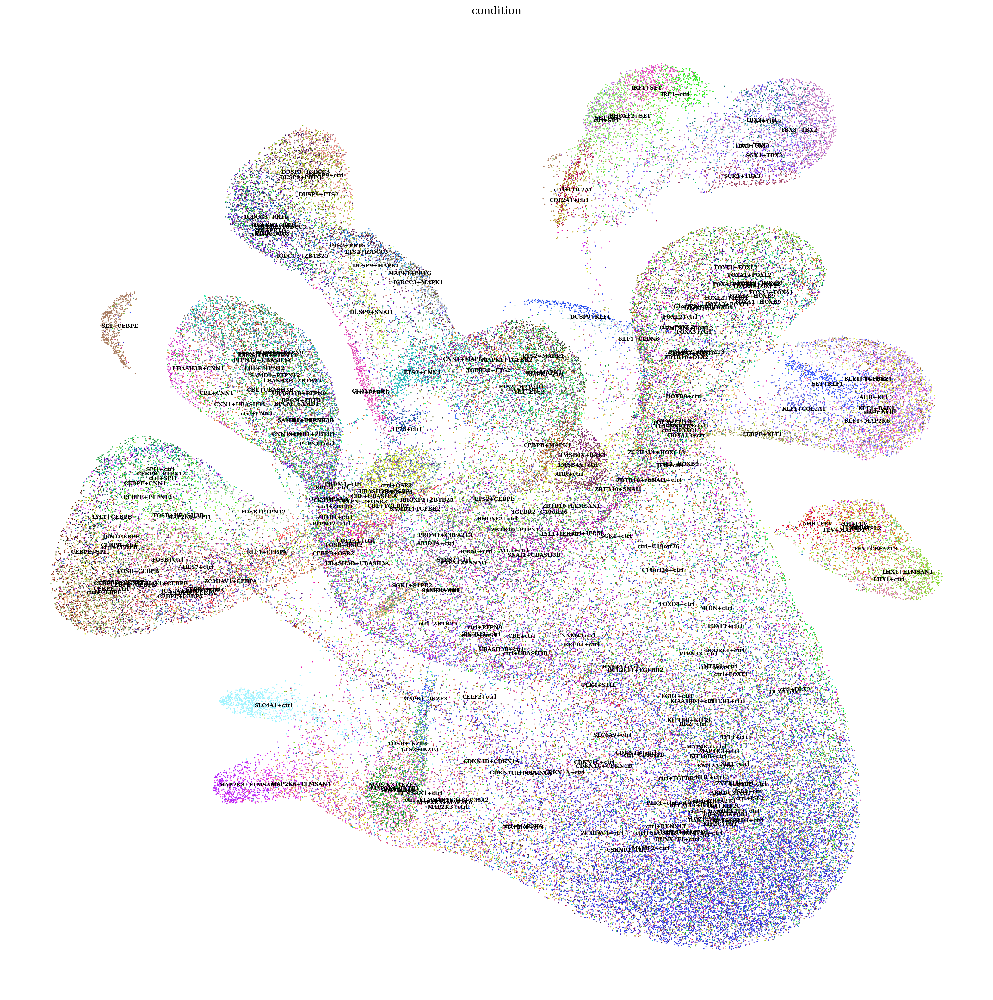

In [12]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()

In [13]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

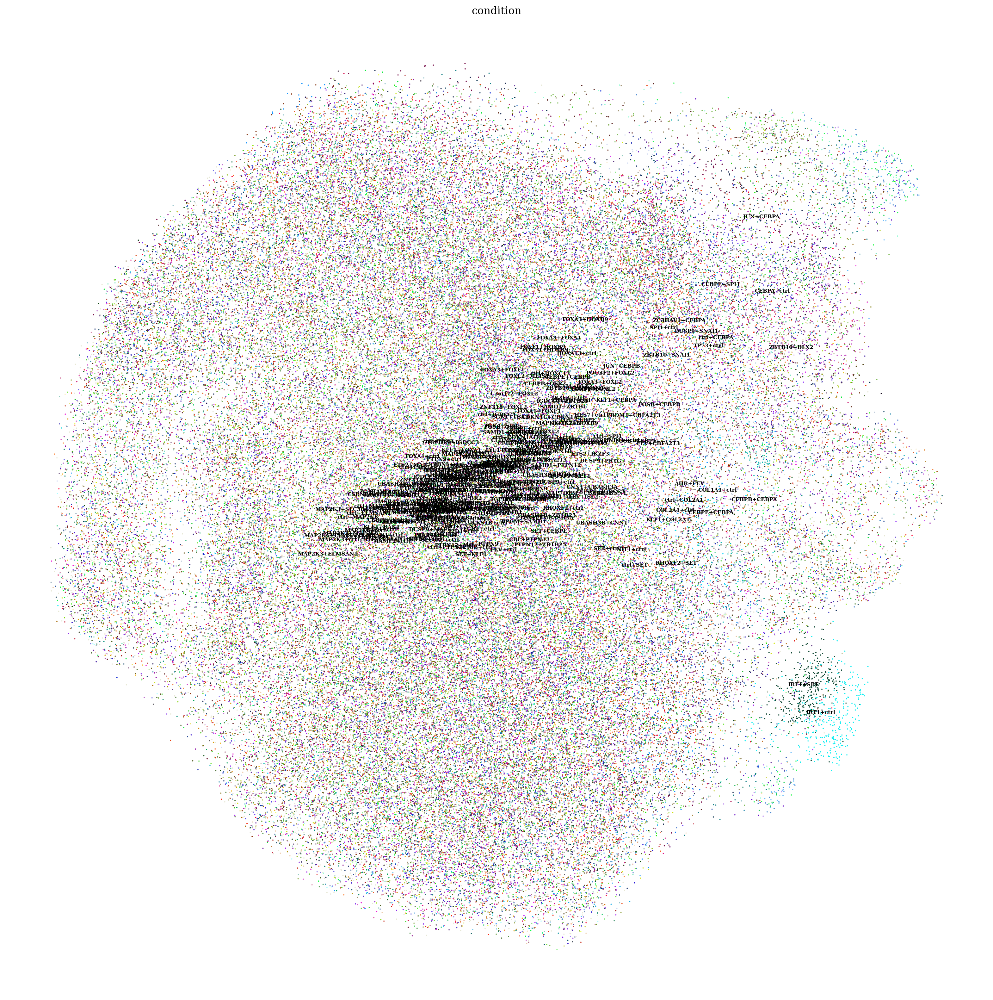

In [14]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()